In [1]:
fasta_file = "/home/nandana/Desktop/Sequence-Alignment-Tool-with-Visualization/BOPP01000041.1 Gryllus bimaculatus .fasta"  # Replace with the actual path to your downloaded FASTA file

def read_fasta(file_path):
    sequences = []
    with open(file_path, "r") as file:
        for line in file:
            line = line.strip()
            if line.startswith(">"):
                if sequences:
                    yield sequences
                    sequences = []
            else:
                sequences.append(line)
        if sequences:
            yield sequences

def print_sequences(sequences):
    for i, sequence in enumerate(sequences):
        print(f"Sequence {i+1}: {sequence}")
    print("--------------------------------------")

sequence_list = []
for batch in read_fasta(fasta_file):
    sequence_list.extend(batch)

batch_size = 5  # Adjust the batch size as needed

for i in range(0, len(sequence_list), batch_size):
    batch = sequence_list[i:i+batch_size]
    print_sequences(batch)

output_file = "/home/nandana/Desktop/sequences_output.txt"  # Replace with the desired output file path

with open(output_file, "w") as file:
    for sequence in sequence_list:
        file.write(sequence + "\n")


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Sequence 1: ATTATGAGTGGATGGAATAAAAAAATGTACTCCTGATTGCAACGAGCTTTCTAAGAAGCAAAACTAGGGA
Sequence 2: GTGTCGGTGACCCTACATCACTTTAAGCAACATGTGGTCTGTTCCCAATACGAGGTATACTAGGATTTAT
Sequence 3: TTAACCGTGCACTTGACGTAAGTCAGCTGATCACAGTTTCATCCACTCGAGAGCTGGAACGTTCCCATAG
Sequence 4: TATGTCCCACTCATCTCCGCAAGAGAAATCGTACACGTTTTTCATATGTTCTCGTACATTTCTCTGGAAT
Sequence 5: TATCCAAAAAGTAATGTTAACGAGTCTAATCGTAACACACGCAACACACAAATTAATGAACTCTCTCACA
--------------------------------------
Sequence 1: TAATAAAATCACAGATTGCATTGTACATTTCCGAGAAAATAATCGCTAATATGAAACGTAGAGAAAATGT
Sequence 2: ATTTCCGTAAGTTTTGAAGTTAGAAGCAAGCTGCACAAGAAAATAGAAGGCGATATTTTCCTTTTGCAGA
Sequence 3: AGTTTAGTGTAAAGATAATTTATATATAATACATTTTGAAGAAAGTTTGCTAATAGTTTTTCCTGAATTT
Sequence 4: CGATTTTGTACACGACACAGTCGAGATTCAAAGAAAAGTTATAAACGTATCTCCCTCTACTTGCCACAAA
Sequence 5: AAACAAAGCAACTTGAATATGAAATGGAGGAAAACGCTTTGATGCCGCAACGTGTCCCCAACGCACAAGG
--------------------------------------
Sequence 1: TTGATGTCCAATTCCACATAATTACGAAATTTTTACTTATTCATAAATACGAAAATATAATTACGTTTCG
Sequence 

In [2]:
import numpy as np

def needleman_wunsch(seq1, seq2, match_score=1, mismatch_score=-1, gap_penalty=-1):
    # Initialize the scoring matrix
    n = len(seq1)
    m = len(seq2)
    score_matrix = np.zeros((m+1, n+1))
    
    # Initialize the first row and column
    for i in range(m+1):
        score_matrix[i, 0] = gap_penalty * i
    for j in range(n+1):
        score_matrix[0, j] = gap_penalty * j
    
    # Fill in the scoring matrix
    for i in range(1, m+1):
        for j in range(1, n+1):
            if seq1[j-1] == seq2[i-1]:
                match = match_score
            else:
                match = mismatch_score
            score_matrix[i, j] = max(
                score_matrix[i-1, j-1] + match,
                score_matrix[i-1, j] + gap_penalty,
                score_matrix[i, j-1] + gap_penalty
            )
    
    # Traceback to find the alignment
    align1 = ""
    align2 = ""
    i, j = m, n
    while i > 0 and j > 0:
        if seq1[j-1] == seq2[i-1]:
            match = match_score
        else:
            match = mismatch_score
        if score_matrix[i, j] == score_matrix[i-1, j-1] + match:
            align1 = seq1[j-1] + align1
            align2 = seq2[i-1] + align2
            i -= 1
            j -= 1
        elif score_matrix[i, j] == score_matrix[i-1, j] + gap_penalty:
            align1 = "-" + align1
            align2 = seq2[i-1] + align2
            i -= 1
        else:
            align1 = seq1[j-1] + align1
            align2 = "-" + align2
            j -= 1
    
    while i > 0:
        align1 = "-" + align1
        align2 = seq2[i-1] + align2
        i -= 1
    while j > 0:
        align1 = seq1[j-1] + align1
        align2 = "-" + align2
        j -= 1
    
    return align1, align2

# Read the sequences from the output file
output_file = "/home/nandana/Desktop/sequences_output.txt"  # Replace with the actual output file path
sequence_list = []

with open(output_file, "r") as file:
    for line in file:
        sequence_list.append(line.strip())

# Perform Needleman-Wunsch alignment for each pair of sequences
for i in range(len(sequence_list)):
    for j in range(i+1, len(sequence_list)):
        seq1 = sequence_list[i]
        seq2 = sequence_list[j]
        align1, align2 = needleman_wunsch(seq1, seq2)
        
        print(f"Alignment between Sequence {i+1} and Sequence {j+1}:")
        print("Sequence 1:", align1)
        print("Sequence 2:", align2)
        print("--------------------------------------")


Alignment between Sequence 1 and Sequence 2:
Sequence 1: AC-A--A--CAACTTCAGA-A-AATTCCTCGTC-TGAC-ACAACGGAGGATTCGACAACACCTGACAGCACAACGCCAA
Sequence 2: CCGAGGAGTCGACTTCCGACACAACAGCT-GACGTGTCGTCAAC--AGAATCCAAC-TCAAC-GAC-G--GAATG-GAC
--------------------------------------
Alignment between Sequence 1 and Sequence 3:
Sequence 1: -ACAACAACTTCAGAAAATTCCTCGTC-T-GA---C-ACAACGGAGGATTCGACAAC-ACCTGACAGCAC-AACG-CCAA
Sequence 2: GGCCCCGACTTC--TACA-TCCACGTCTTCGACGTCTACCACGGA-GA--CGACGACGGCC--ACA--ACGGAGGAGGAG
--------------------------------------
Alignment between Sequence 1 and Sequence 4:
Sequence 1: ACAACAACTTCA-GA-AA--ATTCCTCGTCTGACACAA-CGGAGGATTCGAC-AA--CACCTG--ACAGCA-CAAC-GCCAA
Sequence 2: -C-TC--C-CCACGACAACGA-GCC-CG-GAGACTGAATC-GCCG--TCGACGAATTTTCCTGTAACTGAACCTCCTGGC-A
--------------------------------------
Alignment between Sequence 1 and Sequence 5:
Sequence 1: ACAACAACTTCAG-AAAATTCCTC-G-TCTGACAC-AACGGAGGATTCGACAACACCTGACA-----GCACAACGCCAA
Sequence 2: -C-TTTACCACAGTTAAATTCGTCGGTTTTG-C-CTGAC

Alignment between Sequence 1 and Sequence 438:
Sequence 1: --ACAAC----AACT--TCA-GAAAATTCCTCGTC--TGAC-A-CA-ACGGAGGATTCGACA-ACACCTGACAGCACAACGCCAA
Sequence 2: GTACAACAAAGAACTAAGCATGACCATT--T-GTCAAT-ACTACCACACCGCTG-TT-G-CATTTA-CT--C-GC-C-AC-AC-A
--------------------------------------
Alignment between Sequence 1 and Sequence 439:
Sequence 1: -ACAACAACTTCA-G---AAAATTCCTCGTCTGACACAACGGAGGATTCGACAACA-CCTGA-CAGCACAACGCCA---A--
Sequence 2: TATAA-AACCT-ACGTTTAAAATT--T-AT-T---ATAGCGGAAG-TTTGA-ATGAGGAAGAGGGGTATAA-TCCATTTATG
--------------------------------------
Alignment between Sequence 1 and Sequence 440:
Sequence 1: ACAAC-AAC--TTCAGAAA----ATTCCTCGTCTGACA-CAACGGAGGATTCGA-CA-ACACCTGA---CAGCACAACGCCAA
Sequence 2: A-AACTAACAAATCA-AAATGTTATT-TTCGT-TTA-ATTGAC--A-TATTCTAGCATA-A-GTTATTGTTGTTCAA---TAT
--------------------------------------
Alignment between Sequence 1 and Sequence 441:
Sequence 1: ----ACA--A-C-AACT-TCAGA--AAAT-TCCTC-GTCTGACACAACGGAGGATTCGACAACACCTGACAGCACAACGCCAA
Sequence 2: TTTTA-AGT

Alignment between Sequence 1 and Sequence 633:
Sequence 1: A-CAACAACT-TCAGAAAATTC--CTC-G--TCTGACACAACGGA-G-G-ATTCGACA-ACACCTGACAGCACAACGCCAA
Sequence 2: AGTAA-GA-TGT-ATATTTTTCAACTCAGAAGCTG--TCAA-TGATGTGTGTTTAATATTCATTTGA-TG----GTGATTT
--------------------------------------
Alignment between Sequence 1 and Sequence 634:
Sequence 1: ACAACAACT-T-CAGAAAAT-TC--CTC-GTCTGA-CA-CAACGGAG-GAT-TCGACAACACCTGACAGCACAACGCCAA
Sequence 2: -CTTCCATTATACATTATATGTCAACGCAATTTGATAATTAATTGTGTG-TGT-G--TGTGTGTGTGTG-A-GA-G--AG
--------------------------------------
Alignment between Sequence 1 and Sequence 635:
Sequence 1: ACA-ACA-ACTTCAGAAA-ATTCCTCGTCTGACACAACG-GAG-GAT-TCGAC-AACACCTGACAGCACAACGCCAA
Sequence 2: AGAGAGAGA---GAGAAAGAAAGAGAGAGAGAGAGTGCGTGTGCG-TGT-G-CGAGTGCGTGTGTGTGC-GCGCGTG
--------------------------------------
Alignment between Sequence 1 and Sequence 636:
Sequence 1: -AC-AACAACTTCAG-AA-AA-TT--CCTCGTCTGACACAACGGAGGATTCGACAACACCTGAC-AGCACAA--CG-CCAA
Sequence 2: CGCGTGC-GCGTGTGTAATAAGTTAAACTTGTC--

Alignment between Sequence 1 and Sequence 1936:
Sequence 1: ACAACAACTTCAGAAAATTCCTCGTCTGAC-ACAACGGAGGATT-C--GACAA--CACCTG-A--CAGCACAAC-GCCAA
Sequence 2: ----TTTCTT-TTTAAATACCTTG-CAG-CGATAAC-CA-G-TTCCATTAAAATGCAAGTGAATCCAGAAAAACTTCCAT
--------------------------------------
Alignment between Sequence 1 and Sequence 1937:
Sequence 1: ACAACAACT-TC-A-GAAAAT--TCCT-CGTCTGA-CACAACGGAGGATTCGACAACACCTGACAGCACAACGCCAA
Sequence 2: CCTATATTTCTCAATGTAAGTGGT-TTAATTTTTATAATAAATAATGA-T-GA-AATA-TTTTCATTTC--TGCCCT
--------------------------------------
Alignment between Sequence 1 and Sequence 1938:
Sequence 1: --ACA-ACAACTT-CA-G-AAAATTC-CTCGTC--TGACACAACGGAGGATTC-GACAACACCTGACAGCACAACGCCA--A
Sequence 2: GTGTAGTCAA-TTGGAGGCACAA-GCACAAG-CAATGGCTC-ATGCAGG-TACTG-CCACA-CT-AC-G--TATC-CCAGTG
--------------------------------------
Alignment between Sequence 1 and Sequence 1939:
Sequence 1: ACAACAACTTCAG-AAAATTCCTCGTCTGA-CACAACGGA--GGAT-TCGACA-ACACCTGACAGCACAACGCCAA
Sequence 2: ACTTCAACTAGTGCACAAGTGGAC-ACTGATAAC

Alignment between Sequence 1 and Sequence 2632:
Sequence 1: AC--AACAACTTCAGAAAATTCCT-CGTCTGACACAACG--GAGGATTCGA--CA-ACAC-CTGACAGCA----CAAC-GCCAA
Sequence 2: -CGGTAC-AC--C----AA-CCCTACGTCTCA-AC-ACGCCCCGGATGC-ACCCATAAACAGTGAGAG-AGTGGGAACAG-TGA
--------------------------------------
Alignment between Sequence 1 and Sequence 2633:
Sequence 1: ACAACAACTTCAGAAAATTCCTCGTCTGACACAACGGAGGATTC-GA--CAAC-ACC-TGACA-G-CAC--A-A-CGCCA-A
Sequence 2: ---GC-GGTTCCG-CAA--GCGAG-CAGGC-GAGCGG-GGA--CAGATGCACCGCCCAAGACACGTCGCTGAGAGAGCGAGC
--------------------------------------
Alignment between Sequence 1 and Sequence 2634:
Sequence 1: --ACAACAACTTCAGAAAATTCCTCGT-CT-GA--CACAACGGAGGATTCGA-CAACACCTG-ACAG-CACAACGCCAA
Sequence 2: GTTCCACCGC-ACAG-CCATTTAGCGTATTCGAGTCGCAA--GA-GACT-GATC--TAGC-GCAGAGTCGCAGTGCCTC
--------------------------------------
Alignment between Sequence 1 and Sequence 2635:
Sequence 1: ACAACAACTTCAGAAAATTCCT--CGTCTGACACAAC-G-G-AG-G-A-TTCGACAACAC-CT-GACAGC-ACAACGCCAA
Sequence 2: A-GACTGC--CTG--AA

Alignment between Sequence 1 and Sequence 3620:
Sequence 1: ACAACAACTTCAGAAAAT-TC-CTCGTC-TGACACAACGGA-GGAT-TCGACAACACCTGACAGC-ACA---ACG---CCA-A
Sequence 2: --------TTTAAAAAATATCGATC-ACAT-ACACAA-TTACTTATATC-A-AACACAAAACATCGACATGGATGTTACGAGG
--------------------------------------
Alignment between Sequence 1 and Sequence 3621:
Sequence 1: ---AC-AACA-AC-TTC-AGA-AAATTCCTCGTCTGACA--CAACGGAGGATTCGACAAC-ACCTGAC-AGCA-CAACGCCAA
Sequence 2: TTGCCAAACATGCATTCAAAAGAAATT--TAGCCT-ACATTC-TCTTA--TTTTTAC--CGA-ATG-CTAG-AGTTTTG--TT
--------------------------------------
Alignment between Sequence 1 and Sequence 3622:
Sequence 1: ACAACAACTTCAGAAAATTC-CTCGTCTGACACA-ACGGAG--GAT-T-CGA-CAA-CAC---CTGACAGCA-CAACGCCAA
Sequence 2: -CGA-ATC-T-AG--CGTACAC-C-TCTG-CACAGA-GGAGTACATATCCGAGAAAGCACGTTTTTATAAAATTAGTGCC--
--------------------------------------
Alignment between Sequence 1 and Sequence 3623:
Sequence 1: A---CAACAACTTCAGAA--AATTCCTCGTCT-G-ACA-CAACGGA-GGATTCGACAACACCTGACAGCACAACGCCAA--
Sequence 2: ATTTTAA-AA-

Alignment between Sequence 1 and Sequence 4634:
Sequence 1: ACAACAACTTCA-GAAAATTCCT-CGTCTGACACAACGGAG-GATTCG-ACAACACCTG-ACA-GCA-CAAC-GCCAA
Sequence 2: -TGTTAA-TTCATGGAGTTTGATGCATTTTATA-TA-GG-GTG-TT-GTATGGTA-ATGTAAATGTATCTTCTATAAA
--------------------------------------
Alignment between Sequence 1 and Sequence 4635:
Sequence 1: -AC-AAC--A--ACT-TCAGAAAATTCCTCGTCTGACACAACGGAG-GATTCGACAACACCTGACAGC-ACAACGCCAA
Sequence 2: GTCTTCCTTATCTCTATCTTTGAATTGCT-GTATG----ATCTGAGCTTTTCCCCCA-ATTTCATTTCTAGGA-GGC--
--------------------------------------
Alignment between Sequence 1 and Sequence 4636:
Sequence 1: ACAACA--ACTTCAGA--AAATT-CCTCGTCTGACACAACGGAGGATTC-GACAACACCTGAC-A--GCA-CAACGCCAA
Sequence 2: TTAACATTGTTTTATACTTTATTACCACG-C--AC-CTAC--A-TTTTCTG---GTGCCTGACAATTGAATTAACATTAA
--------------------------------------
Alignment between Sequence 1 and Sequence 4637:
Sequence 1: ACAACAACTTCAGAAAAT-T-CCTCGTCTGACA-CAACGGAGGATT-CG-A-CA-ACACCTGACAG-CACAAC--GCCAA
Sequence 2: ---TGTGTTTGGGAGAATGTATATCATGTGATAT

Alignment between Sequence 1 and Sequence 4972:
Sequence 1: --ACAACA-ACTT-C---AGAA-AATTCCTCGTCTGACACAACG-GAGG-AT-TCG-ACAACACCTGACAGCA-CAACGCCAA
Sequence 2: GTATATTATTTTTGCATTAGAAGAA-T-C-CGAGT-A-A-GGCGTG-GGAATATAGTA-AA-AGGTTACA--ATTAA-ATC-A
--------------------------------------
Alignment between Sequence 1 and Sequence 4973:
Sequence 1: ACAACAACT-TCAGAAAATTCCTCGTCTGACACAACGGAGG---ATTCG-ACA---A-----CA-CCTGACAGCACAACGCCAA
Sequence 2: GC-GCTAGTGT-AG----TT--TTGTAT-A-A-TA-GTAGGTTTAGTCGTTCATTTATGGTTCATGTTGGTTG-GTGATG-GTT
--------------------------------------
Alignment between Sequence 1 and Sequence 4974:
Sequence 1: ACAACAACTTCA-GAA-AAT--TCC-T---CGTCTGACACAACG-G-AGGATTCGAC-AACACCTGACAGCACAACGCCAA
Sequence 2: ----CATGTT-ATGAACCATGGTCCTTAGCCG-CTTA-TTAATGAGAATGATTTGTCGAGTAATTTTC-TCAC-AC-CC-C
--------------------------------------
Alignment between Sequence 1 and Sequence 4975:
Sequence 1: ACAACAACTTC-AG----AAAA-T--TCCTCGTCTG-ACAC-A-ACG-GAGGATTCGACAACACCTGACAGCACAACGCCAA
Sequence 2: -TGATTACTT

Alignment between Sequence 1 and Sequence 6002:
Sequence 1: ---ACA-A--CAA-CT-TCAGAAAATTCCTCGTCTGACACAACGGAGGATTCGACAACACCTGACAGCAC-AACGCCAA
Sequence 2: TCAACATATGCAACCTCTCCTACAATT-TTC-TTTTTC-C-TC---TTTTTCTCCTTTGCCT--CTTTTCTTTTACCTT
--------------------------------------
Alignment between Sequence 1 and Sequence 6003:
Sequence 1: --AC--AAC-AACTTCAGAAAATTCCTCGTCTGACA-CAACGGAGGATT-CG-ACAACACCTGACAG-CACAA-CGCCAA
Sequence 2: TCTCTTCTCTAAATT-A-AAAAAAAGT-GT-T-ACATTTAC--A-GATTATGCTCAATA-CTTACAGATATAATC-ACAC
--------------------------------------
Alignment between Sequence 1 and Sequence 6004:
Sequence 1: ACAACA-ACT--TCAGAAAATTCCTCGTCTG-AC-ACAAC-G-GAG-GATTCGA-CAACA-CCTGAC-AGCACAACGCCAA
Sequence 2: A-AAGATA-TAATC-GAGATTTCCACAAAAGTACTA-AACTGTCAGCTATT-GATCAA-ATCAT-ACTTGC-CAA---AAA
--------------------------------------
Alignment between Sequence 1 and Sequence 6005:
Sequence 1: ACAAC---AAC-TTCAGAAAAT-TCCTCGTCTGACACAACGGAGGAT-TC--GACAAC-A--CCTGACA-GC-ACAACGCCAA
Sequence 2: ATTACTGAAACATTCATATGATGT-

KeyboardInterrupt: 

In [3]:
import numpy as np

def needleman_wunsch(seq1, seq2, match_score=1, mismatch_score=-1, gap_penalty=-1):
    # Initialize the scoring matrix
    n = len(seq1)
    m = len(seq2)
    score_matrix = np.zeros((m+1, n+1))
    
    # Initialize the first row and column
    for i in range(m+1):
        score_matrix[i, 0] = gap_penalty * i
    for j in range(n+1):
        score_matrix[0, j] = gap_penalty * j
    
    # Fill in the scoring matrix
    for i in range(1, m+1):
        for j in range(1, n+1):
            if seq1[j-1] == seq2[i-1]:
                match = match_score
            else:
                match = mismatch_score
            score_matrix[i, j] = max(
                score_matrix[i-1, j-1] + match,
                score_matrix[i-1, j] + gap_penalty,
                score_matrix[i, j-1] + gap_penalty
            )
    
    # Traceback to find the alignment
    align1 = ""
    align2 = ""
    i, j = m, n
    while i > 0 and j > 0:
        if seq1[j-1] == seq2[i-1]:
            match = match_score
        else:
            match = mismatch_score
        if score_matrix[i, j] == score_matrix[i-1, j-1] + match:
            align1 = seq1[j-1] + align1
            align2 = seq2[i-1] + align2
            i -= 1
            j -= 1
        elif score_matrix[i, j] == score_matrix[i-1, j] + gap_penalty:
            align1 = "-" + align1
            align2 = seq2[i-1] + align2
            i -= 1
        else:
            align1 = seq1[j-1] + align1
            align2 = "-" + align2
            j -= 1
    
    while i > 0:
        align1 = "-" + align1
        align2 = seq2[i-1] + align2
        i -= 1
    while j > 0:
        align1 = seq1[j-1] + align1
        align2 = "-" + align2
        j -= 1
    
    return align1, align2, score_matrix

# Read the sequences from the output file
output_file = "/home/nandana/Desktop/sequences_output.txt"  # Replace with the actual output file path
sequence_list = []

with open(output_file, "r") as file:
    for line in file:
        sequence_list.append(line.strip())

# Perform Needleman-Wunsch alignment for each pair of sequences
for i in range(len(sequence_list)):
    for j in range(i+1, len(sequence_list)):
        seq1 = sequence_list[i]
        seq2 = sequence_list[j]
        align1, align2, score_matrix = needleman_wunsch(seq1, seq2)
        
        print(f"Alignment between Sequence {i+1} and Sequence {j+1}:")
        print("Sequence 1:", align1)
        print("Sequence 2:", align2)
        print("Score Matrix:")
        for row in score_matrix:
            for score in row:
                print(f"{int(score):4}", end=" ")
            print()
        print("--------------------------------------")


Alignment between Sequence 1 and Sequence 2:
Sequence 1: AC-A--A--CAACTTCAGA-A-AATTCCTCGTC-TGAC-ACAACGGAGGATTCGACAACACCTGACAGCACAACGCCAA
Sequence 2: CCGAGGAGTCGACTTCCGACACAACAGCT-GACGTGTCGTCAAC--AGAATCCAAC-TCAAC-GAC-G--GAATG-GAC
Score Matrix:
   0   -1   -2   -3   -4   -5   -6   -7   -8   -9  -10  -11  -12  -13  -14  -15  -16  -17  -18  -19  -20  -21  -22  -23  -24  -25  -26  -27  -28  -29  -30  -31  -32  -33  -34  -35  -36  -37  -38  -39  -40  -41  -42  -43  -44  -45  -46  -47  -48  -49  -50  -51  -52  -53  -54  -55  -56  -57  -58  -59  -60  -61  -62  -63  -64  -65  -66  -67  -68  -69  -70 
  -1   -1    0   -1   -2   -3   -4   -5   -6   -7   -8   -9  -10  -11  -12  -13  -14  -15  -16  -17  -18  -19  -20  -21  -22  -23  -24  -25  -26  -27  -28  -29  -30  -31  -32  -33  -34  -35  -36  -37  -38  -39  -40  -41  -42  -43  -44  -45  -46  -47  -48  -49  -50  -51  -52  -53  -54  -55  -56  -57  -58  -59  -60  -61  -62  -63  -64  -65  -66  -67  -68 
  -2   -2    0   -1   -2   -1   -2   -3   -4 

 -59  -57  -55  -53  -51  -49  -47  -45  -43  -41  -39  -37  -35  -33  -31  -29  -27  -25  -23  -21  -19  -17  -17  -15  -16  -14  -12  -12  -12  -12  -10  -10   -8   -8   -8   -6   -7   -8   -6   -6   -6   -5   -3   -1    1    0   -1   -1   -1   -1    1    1    3    4    4    4    4    6    5    5    7    6    7    6    6    8    7    7    6    5    4 
 -60  -58  -56  -54  -52  -50  -48  -46  -44  -42  -40  -38  -36  -34  -32  -30  -28  -26  -24  -22  -20  -18  -18  -16  -16  -15  -13  -13  -13  -13  -11  -11   -9   -9   -9   -7   -7   -8   -7   -7   -7   -6   -4   -2    0    0   -1    0   -1   -2    0    0    2    4    3    3    3    5    5    4    6    6    7    6    5    7    7    8    8    7    6 
 -61  -59  -57  -55  -53  -51  -49  -47  -45  -43  -41  -39  -37  -35  -33  -31  -29  -27  -25  -23  -21  -19  -19  -17  -17  -16  -14  -14  -14  -12  -12  -10  -10   -8   -8   -8   -8   -8   -7   -8   -8   -6   -5   -3   -1   -1    1    0    1    0   -1    1    1    3    3    2    4    

 -19  -17  -15  -13  -11   -9   -7   -5   -3   -3   -3   -1    1    0    1    3    5    5    4    3    4    5    5    4    3    2    1    0   -1    0   -1    0   -1    1    0   -1   -2   -3   -2   -3   -4   -5   -6   -7   -8   -9  -10  -11  -12  -13  -14  -15  -16  -17  -18  -19  -20  -21  -22  -23  -24  -25  -26  -25  -26  -27  -28  -29  -30  -31  -32 
 -20  -18  -16  -14  -12  -10   -8   -6   -4   -4   -4   -2    0    0    0    2    4    4    4    3    4    5    4    6    5    4    3    2    1    0    1    0    1    0    0    1    0   -1   -2   -3   -4   -5   -6   -7   -6   -7   -8   -9  -10  -11  -12  -13  -14  -15  -16  -17  -18  -19  -20  -21  -22  -23  -24  -25  -26  -25  -26  -27  -28  -29  -30 
 -21  -19  -17  -15  -13  -11   -9   -7   -5   -5   -5   -3   -1    1    0    1    3    3    3    3    3    4    4    5    7    6    5    4    3    2    1    0    0    0   -1    0    2    1    0   -1   -2   -3   -4   -5   -6   -5   -6   -7   -8   -9  -10  -11  -12  -13  -14  -15  -16  -1

 -67  -65  -63  -61  -59  -57  -55  -53  -51  -49  -47  -45  -43  -41  -39  -37  -35  -33  -31  -31  -29  -27  -25  -25  -24  -22  -20  -18  -18  -16  -14  -12  -10   -8   -6   -6   -6   -6   -4   -4   -4   -2    0    0    0    0    2    3    5    7    7    8    8    7    8    7    6    6    7    7    7    8    8    8    9    9    8    7    6    5    5 
 -68  -66  -64  -62  -60  -58  -56  -54  -52  -50  -48  -46  -44  -42  -40  -38  -36  -34  -32  -32  -30  -28  -26  -26  -25  -23  -21  -19  -19  -17  -15  -13  -11   -9   -7   -7   -7   -7   -5   -5   -5   -3   -1   -1   -1   -1    1    2    4    6    6    8    7    7    7    7    8    7    7    6    6    8    7    9    9    8    8    7    6    7    6 
 -69  -67  -65  -63  -61  -59  -57  -55  -53  -51  -49  -47  -45  -43  -41  -39  -37  -35  -33  -33  -31  -29  -27  -27  -26  -24  -22  -20  -20  -18  -16  -14  -12  -10   -8   -8   -8   -8   -6   -6   -6   -4   -2   -2   -2   -2    0    1    3    5    5    7    7    6    6    6    8    

 -20  -18  -16  -14  -14  -14  -12  -12  -12  -10   -8   -6   -4   -5   -4   -4   -5   -5   -6   -7   -6   -6   -7   -5   -5   -6   -5   -5   -4   -2   -3   -1   -2   -3   -4   -5   -6   -7   -8   -9  -10  -11  -12  -13  -14  -15  -16  -17  -18  -19  -20  -21  -22  -23  -24  -25  -26  -27  -25  -26  -27  -27  -28  -29  -30  -31  -32  -33  -34  -35  -36 
 -21  -19  -17  -15  -15  -15  -13  -13  -13  -11   -9   -7   -5   -5   -5   -5   -5   -6   -4   -5   -6   -7   -5   -6   -6   -4   -5   -4   -5   -3   -3   -2   -2   -3   -4   -5   -6   -7   -8   -9  -10  -11  -10  -11  -12  -13  -14  -15  -16  -17  -18  -19  -20  -21  -22  -23  -24  -25  -26  -26  -27  -28  -28  -29  -30  -31  -32  -33  -34  -35  -36 
 -22  -20  -18  -16  -16  -16  -14  -14  -14  -12  -10   -8   -6   -6   -6   -6   -6   -6   -5   -3   -4   -5   -6   -6   -7   -5   -5   -4   -5   -4   -4   -3   -3   -3   -4   -5   -6   -7   -8   -9  -10  -11  -10   -9  -10  -11  -12  -13  -14  -15  -16  -17  -18  -19  -20  -21  -22  -2

 -15  -13  -11   -9   -7   -7   -5   -5   -5   -4   -4   -5   -3   -3   -1    0    0    0   -1   -2   -3   -4   -5   -5   -6   -6   -6   -7   -8   -7   -8   -7   -8   -7   -8   -9  -10  -11  -12  -13  -14  -15  -16  -17  -18  -19  -18  -19  -20  -21  -22  -23  -24  -25  -26  -27  -28  -29  -30  -31  -32  -33  -34  -35  -36  -37  -38  -39  -40  -41  -42 
 -16  -14  -12  -10   -8   -8   -6   -4   -5   -5   -5   -5   -4   -4   -2    0    1    1    0   -1   -2   -3   -4   -5   -6   -7   -7   -7   -8   -7   -8   -7   -8   -7   -6   -7   -8   -9  -10  -11  -12  -13  -14  -15  -16  -17  -18  -19  -18  -19  -20  -21  -22  -23  -24  -25  -26  -27  -28  -29  -30  -31  -32  -33  -34  -35  -36  -37  -38  -39  -40 
 -17  -15  -13  -11   -9   -9   -7   -5   -5   -4   -4   -5   -5   -5   -3   -1    0    0    2    1    0   -1   -2   -3   -4   -5   -6   -6   -7   -8   -8   -8   -8   -8   -7   -7   -8   -9  -10  -11  -12  -13  -12  -13  -14  -15  -16  -17  -18  -19  -20  -21  -22  -23  -22  -23  -24  -2

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



   -1    0    0   -1   -2   -2   -2    0    0   -1    0    2    1    0    1    1    0    2    2    1    1    0    0    0   -1   -1   -2   -3 
 -51  -49  -47  -45  -43  -41  -39  -37  -35  -33  -31  -29  -27  -27  -25  -23  -23  -22  -20  -18  -16  -14  -12  -12  -12  -11  -11   -9   -9   -8   -9   -7   -7   -5   -5   -6   -6   -6   -4   -5   -6   -4   -4   -2   -1   -1    1    0   -1   -1   -1    1    0   -1    1    1    2    1    2    1    1    3    2    2    2    1    0   -1   -2    0   -1 
 -52  -50  -48  -46  -44  -42  -40  -38  -36  -34  -32  -30  -28  -28  -26  -24  -22  -22  -21  -19  -17  -15  -13  -13  -13  -12  -12  -10  -10   -8   -9   -8   -8   -6   -4   -5   -6   -7   -5   -5   -6   -5   -5   -3   -2   -2    0    0    1    0   -1    0    0   -1    0    0    2    1    2    1    0    2    2    3    3    2    1    0   -1   -1    1 
 -53  -51  -49  -47  -45  -43  -41  -39  -37  -35  -33  -31  -29  -29  -27  -25  -23  -23  -21  -20  -18  -16  -14  -14  -14  -12  -13  -11  -11  

 -18  -16  -14  -12  -10   -8   -6   -4   -2   -2   -3   -3   -1   -2   -1   -1    0    0   -1   -2   -3   -3   -4   -5   -6   -7   -8   -9  -10   -9   -9   -7   -8   -7   -8   -9  -10  -11  -12  -13  -14  -15  -16  -17  -18  -19  -20  -21  -20  -21  -22  -21  -22  -23  -24  -25  -26  -27  -28  -29  -30  -29  -30  -31  -32  -33  -34  -35  -36  -37  -38 
 -19  -17  -15  -13  -11   -9   -7   -5   -3   -3   -3   -4   -2    0   -1   -2   -1   -1   -1   -2   -3   -4   -4   -5   -4   -5   -6   -7   -8   -9  -10   -8   -8   -8   -8   -9   -8   -9  -10  -11  -12  -13  -14  -15  -16  -17  -18  -19  -20  -21  -22  -22  -22  -23  -24  -23  -24  -25  -26  -27  -28  -29  -30  -31  -32  -33  -32  -33  -34  -35  -36 
 -20  -18  -16  -14  -12  -10   -8   -6   -4   -4   -4   -4   -3   -1    1    0   -1    0   -1   -2   -3   -4   -5   -5   -5   -5   -6   -7   -8   -7   -8   -9   -9   -7   -7   -8   -9   -9   -8   -9  -10  -11  -12  -13  -14  -15  -16  -17  -18  -19  -20  -21  -22  -23  -24  -24  -22  -2

 -17  -15  -15  -13  -13  -13  -11  -11  -11  -11  -11  -11   -9   -7   -7   -7   -7   -8   -8   -9  -10  -11  -12  -13  -11  -11  -11  -11   -9   -9  -10  -11  -12  -13  -14  -15  -14  -13  -14  -13  -12  -13  -14  -15  -16  -17  -18  -19  -20  -21  -22  -23  -24  -25  -26  -25  -26  -27  -28  -29  -30  -31  -32  -33  -34  -35  -36  -37  -38  -39  -40 
 -18  -16  -16  -14  -14  -14  -12  -12  -12  -10  -10  -11  -10   -8   -8   -8   -8   -8   -7   -7   -8   -9  -10  -11  -12  -10  -11  -10  -10  -10  -10  -11  -12  -13  -14  -15  -15  -14  -14  -14  -13  -13  -12  -13  -14  -15  -16  -17  -18  -19  -20  -21  -22  -23  -24  -25  -26  -27  -28  -29  -30  -31  -32  -33  -34  -35  -36  -37  -38  -39  -40 
 -19  -17  -17  -15  -15  -15  -13  -13  -13  -11  -11  -11  -11   -9   -9   -9   -9   -9   -8   -8   -8   -9  -10  -11  -10  -11  -11  -11   -9  -10  -11  -11  -12  -13  -14  -15  -14  -14  -15  -13  -13  -14  -13  -13  -14  -13  -14  -15  -16  -17  -18  -19  -20  -21  -22  -23  -24  -2

 -60  -58  -56  -54  -52  -50  -48  -46  -44  -42  -40  -38  -36  -34  -32  -30  -28  -26  -24  -24  -22  -20  -19  -17  -17  -17  -16  -16  -16  -14  -14  -12  -12  -10  -10   -8   -8   -8   -6   -7   -7   -5   -6   -7   -5   -5   -3   -4   -3   -4   -2    0    0    2    2    1    3    3    5    4    3    4    3    3    2    1    0    1    3    5    4 
 -61  -59  -57  -55  -53  -51  -49  -47  -45  -43  -41  -39  -37  -35  -33  -31  -29  -27  -25  -25  -23  -21  -20  -18  -18  -18  -17  -17  -17  -15  -15  -13  -13  -11   -9   -9   -9   -9   -7   -7   -8   -6   -6   -7   -6   -6   -4   -4   -3   -2   -3   -1   -1    1    1    1    2    2    4    4    3    4    3    4    4    3    2    1    2    4    6 
 -62  -60  -58  -56  -54  -52  -50  -48  -46  -44  -42  -40  -38  -36  -34  -32  -30  -28  -26  -26  -24  -22  -21  -19  -19  -19  -18  -18  -18  -16  -16  -14  -14  -12  -10  -10  -10  -10   -8   -8   -8   -7   -7   -7   -7   -7   -5   -5   -3   -2   -3   -2   -2    0    0    0    2    

 -24  -22  -20  -18  -16  -14  -12  -10   -8   -6   -7   -8   -6   -6   -4   -2   -2   -2   -1   -2   -3   -4   -3   -4   -4   -3   -3   -1   -2   -3   -2   -2   -1   -1   -2   -3   -4   -5   -6   -7   -8   -9   -8   -8   -9  -10  -11  -12  -13  -14  -15  -15  -16  -17  -16  -17  -18  -19  -20  -21  -21  -21  -22  -23  -24  -24  -24  -25  -26  -27  -28 
 -25  -23  -21  -19  -17  -15  -13  -11   -9   -7   -7   -6   -7   -7   -5   -3   -3   -3   -2   -2   -1   -2   -3   -2   -3   -4   -2   -2   -2   -3   -2   -3   -1   -2   -2   -1   -2   -3   -4   -5   -6   -7   -8   -9   -7   -8   -9  -10  -11  -12  -13  -14  -14  -15  -16  -17  -18  -17  -18  -19  -20  -21  -20  -21  -22  -23  -24  -23  -24  -25  -26 
 -26  -24  -22  -20  -18  -16  -14  -12  -10   -8   -8   -7   -7   -6   -6   -4   -4   -4   -3   -3   -2   -2   -3   -3   -1   -2   -3   -3   -1   -2   -3   -3   -2   -2   -3   -2    0   -1   -2   -3   -4   -5   -6   -7   -8   -6   -7   -8   -9  -10  -11  -12  -13  -14  -15  -15  -16  -1

 -54  -52  -50  -48  -46  -44  -42  -40  -38  -36  -36  -34  -32  -32  -30  -28  -27  -26  -24  -24  -23  -21  -19  -20  -20  -18  -18  -16  -17  -16  -14  -12  -12  -10  -10   -9   -9   -9   -9   -9  -10  -10   -8   -9  -10  -11  -11  -11   -9   -9   -9   -7   -7   -7   -5   -6   -7   -7   -5   -5   -6   -4   -4   -3   -3   -4   -4   -4   -5   -5   -5 
 -55  -53  -51  -49  -47  -45  -43  -41  -39  -37  -37  -35  -33  -31  -31  -29  -28  -27  -25  -25  -24  -22  -20  -20  -19  -19  -19  -17  -15  -16  -15  -13  -13  -11  -11  -10   -8   -8   -9   -8   -8   -9   -9   -9  -10   -9  -10  -11  -10  -10  -10   -8   -8   -8   -6   -4   -5   -6   -6   -4   -5   -5   -5   -4   -4   -4   -3   -4   -5   -6   -6 
 -56  -54  -52  -50  -48  -46  -44  -42  -40  -38  -38  -36  -34  -32  -30  -30  -28  -27  -26  -26  -25  -23  -21  -21  -20  -20  -20  -18  -16  -14  -15  -14  -14  -12  -10  -11   -9   -9   -7   -8   -9   -7   -8   -9  -10  -10   -8   -9  -10   -9  -10   -9   -9   -9   -7   -5   -3   -

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 -69  -67  -65  -63  -61  -59  -57  -55  -53  -51  -49  -47  -45  -43  -41  -39  -37  -35  -33  -31  -29  -29  -27  -27  -25  -23  -23  -21  -19  -20  -21  -21  -21  -19  -17  -17  -15  -13  -11   -9   -9  -10   -8   -6   -6   -5   -4   -4   -4   -4   -4   -4   -5   -5   -4   -2   -3   -4   -5   -3   -4   -5   -6   -6   -6   -6   -4   -5   -5   -3   -3 
 -70  -68  -66  -64  -62  -60  -58  -56  -54  -52  -50  -48  -46  -44  -42  -40  -38  -36  -34  -32  -30  -30  -28  -28  -26  -24  -24  -22  -20  -20  -21  -22  -22  -20  -18  -18  -16  -14  -12  -10   -8   -9   -9   -7   -7   -5   -5   -5   -5   -5   -5   -5   -5   -6   -5   -3   -3   -4   -5   -4   -4   -5   -6   -7   -7   -7   -5   -5   -6   -4   -4 
--------------------------------------
Alignment between Sequence 1 and Sequence 585:
Sequence 1: ACAACAACTTCA-GA--A-A-ATTCCTCG--TCTGACACAACGGAGGATTCG-ACAA--CACC--TGACAGCACAACGCCAA
Sequence 2: TCAAC-ACTTCATGATCAGATATTAGAAGAAT-TGA-A-AA--AAAGAGTGGTA-AATTCACCGGTG-GAGGAGGATG----
Score Matrix

 -54  -52  -50  -48  -46  -44  -42  -40  -38  -36  -34  -32  -30  -28  -26  -26  -25  -24  -22  -22  -20  -18  -16  -16  -14  -12  -12  -12  -10   -8   -9   -8   -9   -7   -6   -7   -6   -4   -2   -2   -1    1    0   -1   -2   -3   -2   -3   -2    0   -1    0    0    0    1    3    5    4    5    4    3    4    3    2    1    0   -1   -2   -2    0   -1 
 -55  -53  -51  -49  -47  -45  -43  -41  -39  -37  -35  -33  -31  -29  -27  -25  -25  -24  -23  -23  -21  -19  -17  -17  -15  -13  -13  -13  -11   -9   -9   -8   -9   -8   -6   -7   -7   -5   -3   -3   -2    0    0   -1   -2   -3   -2   -3   -2   -1   -1    0   -1   -1    0    2    4    4    5    4    3    4    3    4    3    2    1    0   -1   -1    1 
 -56  -54  -52  -50  -48  -46  -44  -42  -40  -38  -36  -34  -32  -30  -28  -26  -26  -25  -24  -24  -22  -20  -18  -18  -16  -14  -14  -14  -12  -10  -10   -9   -9   -9   -7   -7   -6   -6   -4   -2   -2   -1   -1   -1   -2   -1   -2   -3   -3   -2   -2   -1   -1   -2   -1    1    3    

KeyboardInterrupt: 

In [4]:
import numpy as np

def smith_waterman(seq1, seq2, match_score=1, mismatch_score=-1, gap_penalty=-1):
    # Initialize the scoring matrix and traceback matrix
    n = len(seq1)
    m = len(seq2)
    score_matrix = np.zeros((m+1, n+1))
    traceback_matrix = np.zeros((m+1, n+1), dtype=int)
    
    # Initialize the maximum score and its indices
    max_score = 0
    max_i = 0
    max_j = 0
    
    # Fill in the scoring matrix and traceback matrix
    for i in range(1, m+1):
        for j in range(1, n+1):
            if seq1[j-1] == seq2[i-1]:
                match = match_score
            else:
                match = mismatch_score
            scores = [
                score_matrix[i-1, j-1] + match,
                score_matrix[i-1, j] + gap_penalty,
                score_matrix[i, j-1] + gap_penalty,
                0
            ]
            score_matrix[i, j] = max(scores)
            traceback_matrix[i, j] = scores.index(score_matrix[i, j])
            
            if score_matrix[i, j] > max_score:
                max_score = score_matrix[i, j]
                max_i = i
                max_j = j
    
    # Traceback to find the alignment
    align1 = ""
    align2 = ""
    i, j = max_i, max_j
    while i > 0 and j > 0 and score_matrix[i, j] > 0:
        if traceback_matrix[i, j] == 0:
            align1 = seq1[j-1] + align1
            align2 = seq2[i-1] + align2
            i -= 1
            j -= 1
        elif traceback_matrix[i, j] == 1:
            align1 = "-" + align1
            align2 = seq2[i-1] + align2
            i -= 1
        elif traceback_matrix[i, j] == 2:
            align1 = seq1[j-1] + align1
            align2 = "-" + align2
            j -= 1
        else:
            break
    
    return align1, align2

# Read the sequences from the output file
output_file = "/home/nandana/Desktop/sequences_output.txt"  # Replace with the actual output file path
sequence_list = []

with open(output_file, "r") as file:
    for line in file:
        sequence_list.append(line.strip())

# Perform Smith-Waterman alignment for each pair of sequences
for i in range(len(sequence_list)):
    for j in range(i+1, len(sequence_list)):
        seq1 = sequence_list[i]
        seq2 = sequence_list[j]
        align1, align2 = smith_waterman(seq1, seq2)
        
        print(f"Alignment between Sequence {i+1} and Sequence {j+1}:")
        print("Sequence 1:", align1)
        print("Sequence 2:", align2)
        print("--------------------------------------")


Alignment between Sequence 1 and Sequence 2:
Sequence 1: TCTGACACAAC-G--GAGGAT-TCGACAACACCTGACAGCACAACGCCAA
Sequence 2: TCCGACACAACAGCTGACG-TGTCGTCAACA---GA-ATC-CAAC-TCAA
--------------------------------------
Alignment between Sequence 1 and Sequence 3:
Sequence 1: ACTTCAGAAAATTCCTCGTC-T-GA---C-ACAACGGAGGATTCGACAACACCTGACAGCACAACG
Sequence 2: ACTTC--TACA-TCCACGTCTTCGACGTCTACCACGGA-GA--CGAC--GA-C-GGC--CACAACG
--------------------------------------
Alignment between Sequence 1 and Sequence 4:
Sequence 1: CGACAAC-A-CCTGACAGCAC--AA-CGCC
Sequence 2: CGACAACGAGCCCG-GAG-ACTGAATCGCC
--------------------------------------
Alignment between Sequence 1 and Sequence 5:
Sequence 1: CAG-AAAATTCCTC-G-TCTGACAC-AACGGAGGATTCGACAACACCTGACA
Sequence 2: CAGTTAAATTCGTCGGTTTTG-C-CTGACGAAGG--TGGA-AATGCTTG-CA
--------------------------------------
Alignment between Sequence 1 and Sequence 6:
Sequence 1: AAATTCCTCG--TCTG-A-CACAA
Sequence 2: AAATTGCT-GATTCCGTATCGCAA
--------------------------------------
Alignm

Alignment between Sequence 1 and Sequence 75:
Sequence 1: ACAA-CAA--CTTC-AGA
Sequence 2: ACAAGCAATTCTTCAAGA
--------------------------------------
Alignment between Sequence 1 and Sequence 76:
Sequence 1: AAATTCCTCGTC-TGACACA
Sequence 2: AAATT--T-GTCAT-ATACA
--------------------------------------
Alignment between Sequence 1 and Sequence 77:
Sequence 1: TCTGACACAACGGAGGATTCGA-CAACACCTGA-CAGCACAA
Sequence 2: TCTG---CAA-GTA--ATT-TATCAACA-ATAACCAG-ATAA
--------------------------------------
Alignment between Sequence 1 and Sequence 78:
Sequence 1: TTCCTCGTCTGACA--CAACG-GAGGATTCGA-CAACACCTGACA
Sequence 2: TT-CT-G-CTG-CATTC-TCGTTA-GTTTC-ATC-ACA-TTG-CA
--------------------------------------
Alignment between Sequence 1 and Sequence 79:
Sequence 1: CAACAACTTCAGAAAATTCCTCGTCTG
Sequence 2: CAAAAATTTC--AAAATT-GTC-TCTG
--------------------------------------
Alignment between Sequence 1 and Sequence 80:
Sequence 1: TCTGACACAACGGAG-G--ATTCGA-CAAC-ACCTGACA-GCACAA-CG
Sequence 2: TCT-ACA-AGCGAAGTGTAAA

Alignment between Sequence 1 and Sequence 213:
Sequence 1: AG-AAAATT-CCTCGT-CTGACACAACGGAGGATTCGACAACACCTGACAGCAC
Sequence 2: AGTAAAATTGTTTC-TGCTG-CATAAC---TGTTTCTA-TACA-ATTAGAG-AC
--------------------------------------
Alignment between Sequence 1 and Sequence 214:
Sequence 1: AACTTCAGAAAATTCCTCGTCTGACACAACGGAGGATTCGACA-ACACCT-GA-CAGC
Sequence 2: AAC--CAGAAAAATAAT-GTTTGATTTAACAAAACAGT-GACATA-AAATGGATTAGC
--------------------------------------
Alignment between Sequence 1 and Sequence 215:
Sequence 1: TCCTCGT-C-TGACACAACGGAGGATTCGACA
Sequence 2: TCCCCATGCATGA-A-AA--AAAAATT-GACA
--------------------------------------
Alignment between Sequence 1 and Sequence 216:
Sequence 1: AATTCCTCG
Sequence 2: AATT-CTCG
--------------------------------------
Alignment between Sequence 1 and Sequence 217:
Sequence 1: TCGTCTGAC--ACAACGGAGGATTCGACAACAC
Sequence 2: TCGTTTGACGTA-AATGTA-GCTTC-ATTACAC
--------------------------------------
Alignment between Sequence 1 and Sequence 218:
Sequence 1: CAACTTCA-

Alignment between Sequence 1 and Sequence 420:
Sequence 1: TCC-TCGTCTGA-CA-CA-ACG-GAGG-ATTCGACAAC-ACCTGACAGCACA
Sequence 2: TCCATC--CTGATCACCATTCGTGTGGTAAT--ACATCGTCCTCAC-GAACA
--------------------------------------
Alignment between Sequence 1 and Sequence 421:
Sequence 1: TTCAG-AAAATTCCTCGTCTG
Sequence 2: TTC-GCAAAATACC-CGTATG
--------------------------------------
Alignment between Sequence 1 and Sequence 422:
Sequence 1: CAACTTCAGAA-AATTC-CTCGTCTGAC-ACAAC
Sequence 2: CAACTT-A-AACAA-ACACTTG-CT-ACTACAAC
--------------------------------------
Alignment between Sequence 1 and Sequence 423:
Sequence 1: AC-TTC--AGAAA--A-T--T-CCTCGT-CTGACACAACGGAGGAT-TC-GACA--ACACCTG-ACAGCA-C--AAC
Sequence 2: ACATTCTGTGAAATGATTGATGCATTGTGCTG-C-C-TGGGA-G-TGTCTG-CATGGCA-CTGTAGAG-ATCGGAAC
--------------------------------------
Alignment between Sequence 1 and Sequence 424:
Sequence 1: CAACT-TCAGAAAATTCCTCGTCTG
Sequence 2: CAATTATC-GAATA-GCGTTGTGTG
--------------------------------------
Alignment between Sequ

Alignment between Sequence 1 and Sequence 540:
Sequence 1: TCTGACACAACGGAGGATTCGACAA
Sequence 2: TCTGA-A-AA---A-TATTTGACAA
--------------------------------------
Alignment between Sequence 1 and Sequence 541:
Sequence 1: CAGAAAATTCCT-C-G-TC-TGACACAA
Sequence 2: CAGTAATTTTCTACTGTTCTTG-CACAA
--------------------------------------
Alignment between Sequence 1 and Sequence 542:
Sequence 1: AACAACTTCAGAAAATT
Sequence 2: AA-AACTTCAG-ACATT
--------------------------------------
Alignment between Sequence 1 and Sequence 543:
Sequence 1: TTCGACAACACCTGACAGCACAAC
Sequence 2: TTAGTCCACCCCT-TCA-CACAAC
--------------------------------------
Alignment between Sequence 1 and Sequence 544:
Sequence 1: CAACACCTGACA
Sequence 2: CAAGACCT-ACA
--------------------------------------
Alignment between Sequence 1 and Sequence 545:
Sequence 1: TTCAGAAAATTCCTCGTCTGACACAACGGAGGATTCGAC-AA
Sequence 2: TTTA-ATAATT-CAAATTTGATACAAC--TGTATT-GGCTAA
--------------------------------------
Alignment between Sequence 1 and

Alignment between Sequence 1 and Sequence 631:
Sequence 1: CTGACACAACG--GAGG-ATTCGACAACACCTGAC-AGCACA-ACGC
Sequence 2: CTG-CACCATGTTG-GGAAATC-ATAACCCCT--CGAGAAAATACGC
--------------------------------------
Alignment between Sequence 1 and Sequence 632:
Sequence 1: CAGAAA---AT--TCCT-CG-TCTGACACAACG-GAGGATTCGACAACACCTGACAGCA
Sequence 2: CAGAAAGTTATAGTACTGGGTTATGACGCATTGTG-CG-TT-GA-AA-A-C-GTCAGCA
--------------------------------------
Alignment between Sequence 1 and Sequence 633:
Sequence 1: CAACTTCAGAA
Sequence 2: CAAC-TCAGAA
--------------------------------------
Alignment between Sequence 1 and Sequence 634:
Sequence 1: CAA--CAACTTCAGAAAATTCCTCGTCTG
Sequence 2: CAACGCAA-TT-TGATAATTAATTGTGTG
--------------------------------------
Alignment between Sequence 1 and Sequence 635:
Sequence 1: GACACAACG-GAG-GA
Sequence 2: GAAAGAAAGAGAGAGA
--------------------------------------
Alignment between Sequence 1 and Sequence 636:
Sequence 1: CGTCTG-ACACAACG-GAGGA-TTCGACAAC-ACCTGACAGC-ACAA-CGCCAA
Se

--------------------------------------
Alignment between Sequence 1 and Sequence 679:
Sequence 1: CAGAAAATTCC-T-CGTCTGACACA-ACGGA-GGATT
Sequence 2: CACATACTTCCATCCATC-GAGGCAGACAGACTGATT
--------------------------------------
Alignment between Sequence 1 and Sequence 680:
Sequence 1: AC-AACTTCA-GAAAATT--CC-TCGTCT-G-ACACAACGGAGGAT-TCGACAACACCTGACA
Sequence 2: ACTATCTGCACCAATCTTAACCATC-TTTGGAACAGAAC-TAATATATCG-TAAC-CATGACA
--------------------------------------
Alignment between Sequence 1 and Sequence 681:
Sequence 1: AACAA-CTTCAGAA--A-ATTCCTCGTCTGACACAAC
Sequence 2: AAGAACCTT-A-AACCAGATT-TTAGTC--AC-CAAC
--------------------------------------
Alignment between Sequence 1 and Sequence 682:
Sequence 1: AACTT-CAGA-A-AATTCCTCGTCTGACACAAC-GGAGGATTC
Sequence 2: AA-TTCCA-ATACTTTTCCTC-CCT---A-AACTGTA-G-TTC
--------------------------------------
Alignment between Sequence 1 and Sequence 683:
Sequence 1: ACA-ACTTCA---GAAAATTC--CT-CGTCTGACACA-ACGGAGGATTCGACAACACCTG
Sequence 2: ACAGATTTCACTTG-ATATTC

Alignment between Sequence 1 and Sequence 772:
Sequence 1: AACAACTTC-AGAAAATTCCTCGTCT-GA--CACAAC
Sequence 2: AACAGCATCTAGAATATACCTTGTGTAGATGCAAAAC
--------------------------------------
Alignment between Sequence 1 and Sequence 773:
Sequence 1: GGAGG-ATTCGACAAC--ACCT-GACAGCACAACGCCA
Sequence 2: GGAGGAAATAGACATCTTACGTCGCCTGTACAAATCCA
--------------------------------------
Alignment between Sequence 1 and Sequence 774:
Sequence 1: TTCA-GAAA--A-TTCCTCGTCTGACACAACGGAGG
Sequence 2: TTAAGGAAACTAGATCC-CGT-T--CACAATGCAGG
--------------------------------------
Alignment between Sequence 1 and Sequence 775:
Sequence 1: CGTCTGACACAACGGAG-GATTCGACAA--C---AC-CTG--A-CAGCA-CA-A-CGC
Sequence 2: CGT-T-CCGC-AC-GAGTCCTTCCTCAAGCCTTTACTGTGAAACCAGCACCATATCGC
--------------------------------------
Alignment between Sequence 1 and Sequence 776:
Sequence 1: CAACT-TCAG---AAAATTCCTCGT--CTGAC-ACAAC
Sequence 2: CAACTAT-AGATCAAAATTGCT-GTCACTGCCGA-AAC
--------------------------------------
Alignment between Sequence

Alignment between Sequence 1 and Sequence 824:
Sequence 1: AAAATTCCTCGTCTGACACAACGGAGGATTCGACAACACCTG
Sequence 2: AAAACTCTTCTTC-GGTATTA-GG-GGA--CCACAAAACGTG
--------------------------------------
Alignment between Sequence 1 and Sequence 825:
Sequence 1: CAACTTCAGA-AAATTCCTCGTCTGACA-CAACGGAGGATTCGACAACACCTGAC-AGCACAA
Sequence 2: CAGCATCACATAACTT--TC-TCT-ATATC-ACGTA-TATTTG-C-ACGTATG-CGAG-A-AA
--------------------------------------
Alignment between Sequence 1 and Sequence 826:
Sequence 1: TCCTCG-T-CTGACACAACGGAGGATTCGAC
Sequence 2: TCCTTGATACCG-CA-AA---ATGATT-GAC
--------------------------------------
Alignment between Sequence 1 and Sequence 827:
Sequence 1: AT-TC-CT-CGTCTG-ACACAACG-GAG-G-ATTCGACAACACCTGACAGCACAA
Sequence 2: ATGTCTGTCCGTCTGTGGTCAACGCTAGCGCCTT--A-AAC-CGT-TCAGC-CAA
--------------------------------------
Alignment between Sequence 1 and Sequence 828:
Sequence 1: TTC-A-GAAAATTCCTCGTCTGACACAACGGAGGATT
Sequence 2: TTCAACGACACTT--TC--CTTAAATAAC-GAGG-TT
-----------------------

Alignment between Sequence 1 and Sequence 873:
Sequence 1: CAACAACT-TCAGAAAATTCCTCGTCTGACACAAC-G-GAGGAT-TCGACA
Sequence 2: CAA-TATTCTCGGAAGA-T-GGCGT-TG---CAACTGCGAAG-TAT-GACA
--------------------------------------
Alignment between Sequence 1 and Sequence 874:
Sequence 1: ACAACTTCAGAAAATTCCT--CGTCTGACACAACGGAGGATTCGAC-AAC-ACCTGACAG
Sequence 2: ACAAAGTC---AAATTCATAACCAGTGTTA-AAC--AGGGTGCGACAAACAATTTTACAG
--------------------------------------
Alignment between Sequence 1 and Sequence 875:
Sequence 1: TCA-GAAAATT
Sequence 2: TCATGAAAATT
--------------------------------------
Alignment between Sequence 1 and Sequence 876:
Sequence 1: TTCCTCGTCTGACACAACGGA-GGATTCGAC-AACACCT-GAC
Sequence 2: TTCTTCTTCCGAAATAAAACACTAATTTGACTAA-GCCTAGAC
--------------------------------------
Alignment between Sequence 1 and Sequence 877:
Sequence 1: GTCTGACACAAC-GGA-GGATTCGACAACAC-CTGACAGCACA
Sequence 2: GTGTGA-GCGACGGGATGAAGT-GA-AA-ACGC-GA-AG-ACA
--------------------------------------
Alignment between Sequen

Alignment between Sequence 1 and Sequence 949:
Sequence 1: TTCAGAAAATTCCTCGTCTG
Sequence 2: TTTAAAAAATTGCTC--CTG
--------------------------------------
Alignment between Sequence 1 and Sequence 950:
Sequence 1: ACTTCAGAAAATTCCTCGTCTGACACAACGGAGGATT-C-GACAACACCTGA
Sequence 2: ACTT--GAAATTTTCAAAAATGA-A-AAC--AGG-TTGCTGA-AA-A--TGA
--------------------------------------
Alignment between Sequence 1 and Sequence 951:
Sequence 1: CAGAAA--ATTCCTCGTC-TGACACA-AC-GGAG
Sequence 2: CAGAAATTATT-TTAGTCTTGCCACATACAAGAG
--------------------------------------
Alignment between Sequence 1 and Sequence 952:
Sequence 1: TTCAGAAAATTCCTCGTCTGACACAACGGAGGATTC-G-A-C-AACA-CCTGACAGCACAA
Sequence 2: TTTA-AAAA-T--T-G-CT-ACACAA--GTGTCTACTGTATCTAAAATTCT--CATCA-AA
--------------------------------------
Alignment between Sequence 1 and Sequence 953:
Sequence 1: ATTCGACA-ACACCTGACA
Sequence 2: ATTC-A-AGAC-CCTG-CA
--------------------------------------
Alignment between Sequence 1 and Sequence 954:
Sequence 1: AC-TTCAGA

Alignment between Sequence 1 and Sequence 1219:
Sequence 1: GAAAATT
Sequence 2: GAAAATT
--------------------------------------
Alignment between Sequence 1 and Sequence 1220:
Sequence 1: AACAACTTCAGAAAAT
Sequence 2: AA-AA--TCAGAAAAT
--------------------------------------
Alignment between Sequence 1 and Sequence 1221:
Sequence 1: AACTTCAGAAAATTCCTCGTCTGACACAACGGAGG--ATTCGACAACA-CC-T-GACAG
Sequence 2: AACTTCAGCAAA-T-AT--T-T---A-AA--GAGGTAATT--ATAA-ATCCATAGAAAG
--------------------------------------
Alignment between Sequence 1 and Sequence 1222:
Sequence 1: CTGACACAACGGAGGA
Sequence 2: CT-ACTCAAAGGAGGA
--------------------------------------
Alignment between Sequence 1 and Sequence 1223:
Sequence 1: CAACTTC-AGAAA
Sequence 2: CAATTTCTATAAA
--------------------------------------
Alignment between Sequence 1 and Sequence 1224:
Sequence 1: TC-GTCTGACA-CAAC-G-GAGGAT
Sequence 2: TCAGTGTAAAATTAACTGAGAGGAT
--------------------------------------
Alignment between Sequence 1 and Sequence 1225:
Se

Alignment between Sequence 1 and Sequence 1336:
Sequence 1: ACT-TCAGAAAATTCCTCGTCTGA-CACAACGGAG-GATT
Sequence 2: ACTCTGTGAATATTTAT-G-ATGATCA-AA-AGAGTAATT
--------------------------------------
Alignment between Sequence 1 and Sequence 1337:
Sequence 1: TTCCTCGTCTGA---CACAACGGAGGAT-T-CGA--CAACACCT-G-ACAGCACAACGCCAA
Sequence 2: TTCCT-GT-TGATGTCGCAACAGAGG-TGTATGATCCAAC-CCTAGTGGACCACCATGCTAA
--------------------------------------
Alignment between Sequence 1 and Sequence 1338:
Sequence 1: ATTCCTC-G--TCTG-ACACAA--C----GGAGGAT--TCGACAACAC
Sequence 2: ATTCGTCAGCATCTGTAGTCAATTCTGGTGGAGGATCGTGGACAA-AC
--------------------------------------
Alignment between Sequence 1 and Sequence 1339:
Sequence 1: CTCG-T-CTGACACAACGGAGGAT--T-C-GACAACACCTGACAGCACAACGC
Sequence 2: CT-GCTGCTGCCGCAGCGGCGGCTGCTGCTG-C-TCAGGTTTCA--ACAA-GC
--------------------------------------
Alignment between Sequence 1 and Sequence 1340:
Sequence 1: CCTCGTCTGACACAACGGAGGATTCGACAACACC-TGA-CAGCACAAC
Sequence 2: CCTC--CAG-CACAACAGATG

Alignment between Sequence 1 and Sequence 1652:
Sequence 1: AAAATTCCTCGT-C-TGACACAACGGAGG-ATT
Sequence 2: AATATT-ATTGTACAAGGGA-AACCTAGGCATT
--------------------------------------
Alignment between Sequence 1 and Sequence 1653:
Sequence 1: AATTCCTCGTC-TGA-CA-CAACGGAGGATTCGAC--AACACCTGA
Sequence 2: AATT-ATCG-CATAAGCATC-ATGTCGGCTTTG-CTTTACAGATGA
--------------------------------------
Alignment between Sequence 1 and Sequence 1654:
Sequence 1: AAAATTCCTCGTCTGACA---CAAC--GGAGGAT-TC--GACAACACCTGACAGCACAA
Sequence 2: AAAATTCAT-AT-T-ACATTTTAACTAATATAATGTCTTGA-TTCA-CTGAAAGTACAA
--------------------------------------
Alignment between Sequence 1 and Sequence 1655:
Sequence 1: AAAATTC-C--TCGT-CTGAC-ACAACG--GAGGA--TTC-G-ACAACACCTGACAGCA
Sequence 2: AAAATTCACATTTGTGTTGACTA-ATTGTTGAAGACCTTCTGCACAGCACAT-AAAGCA
--------------------------------------
Alignment between Sequence 1 and Sequence 1656:
Sequence 1: TTCAGAAAAT-TCCTCGTCTGAC-ACAA-CGG-AGGATT
Sequence 2: TT-AGATAGTATCAGAGT-TCACTA-AATTGGCAAGATT
--

Alignment between Sequence 1 and Sequence 2030:
Sequence 1: TCAGAA-AA-TTCCTCGTCTGACACAACG-G--AGGATTCG-A-CAACA-CCTGACAGCACA
Sequence 2: TC-GAATAACTGGATCGTTTG-GA-GGTGTGTAAGGAAACGTAGGAACACCCAGA-AG-ACA
--------------------------------------
Alignment between Sequence 1 and Sequence 2031:
Sequence 1: AACGGAGGA-TTCGACAACACCTGACAG
Sequence 2: AACAGA-CATTTCGGGAAGAGCTG-CAG
--------------------------------------
Alignment between Sequence 1 and Sequence 2032:
Sequence 1: AATTCC-TCGTCTGACACAACGGAGGA-TTCGACAAC-ACCTGACAG
Sequence 2: AATACCAT-ATC-GCCGCAA--AAGCATTTCG-C--CTACC-GTCAG
--------------------------------------
Alignment between Sequence 1 and Sequence 2033:
Sequence 1: AACAACT-TCAGAAAATTCCTCGTCTGAC-ACAACGGAGGATTCGAC-AACACCTGAC
Sequence 2: AA-AA-TGTGATATACGTCCCCGT-TTCCTTCAGCAGTGGAAT--ACTTAC-CCTCAC
--------------------------------------
Alignment between Sequence 1 and Sequence 2034:
Sequence 1: AACT-TCAGA-AAATTCCTCGTCTGACACAACGGAGGATTCGACAACACCTGACAGCACA
Sequence 2: AATTATCA-ATTAAGTGATAG-C--

Alignment between Sequence 1 and Sequence 2644:
Sequence 1: CTCGTCTGA-CA-CAACGGAGG
Sequence 2: CTC-TCCGAGCAGCGACGGCGG
--------------------------------------
Alignment between Sequence 1 and Sequence 2645:
Sequence 1: CTCGTCTGA-CACAACGGAG
Sequence 2: CTC-TCT-ATC-C-ACGCAG
--------------------------------------
Alignment between Sequence 1 and Sequence 2646:
Sequence 1: TCCTCGTCTGACACAACGGA-G-GATTCGACAACACCTG
Sequence 2: TCCACG-C-G-CAC-GCGCACGTGCTCCAAC-ACGCCTG
--------------------------------------
Alignment between Sequence 1 and Sequence 2647:
Sequence 1: CACCTGA-CAGCACAA-CG
Sequence 2: CA-CTCACCATCAAAATCG
--------------------------------------
Alignment between Sequence 1 and Sequence 2648:
Sequence 1: TTCCT
Sequence 2: TTCCT
--------------------------------------
Alignment between Sequence 1 and Sequence 2649:
Sequence 1: GATTC--GACAACACCTGACAGCACAAC-GCCAA
Sequence 2: GATTCGGGATTTCAGC-G-C-GCTCAACTGCTAA
--------------------------------------
Alignment between Sequence 1 and Sequence 26

Alignment between Sequence 1 and Sequence 3198:
Sequence 1: CGTCTGACACAACG-GAGGA-T-TCGACA
Sequence 2: CGTGT-A-ACAGTGCGAGCACTCTCG-CA
--------------------------------------
Alignment between Sequence 1 and Sequence 3199:
Sequence 1: AACAA-CTTCAGAA---AA-TTCC-TCGT-CTGACACA
Sequence 2: AA-AATGTTTA-AAGGTAACTTCCAT-TTACTAACACA
--------------------------------------
Alignment between Sequence 1 and Sequence 3200:
Sequence 1: AACAACTTCAGAAAATTCCTCGTCTGACACAACGGAGGATTCGACAACA
Sequence 2: AACAA--T--G-CAATTGAT-GT-TGA-A-AA-GAAATATTTGA-AGCA
--------------------------------------
Alignment between Sequence 1 and Sequence 3201:
Sequence 1: TTCAGAAAA-TTCCT-CGTC-TGACACAA
Sequence 2: TTTA-AAAACTTTTTAC-TCTTGAGA-AA
--------------------------------------
Alignment between Sequence 1 and Sequence 3202:
Sequence 1: AACTTCAGAAAATTCCTCGTCTGACACAACGGAGGATTC-GACAACA
Sequence 2: AAGTTCATCAAATTACT-G-CTG--ATAAC-GAAAATACTGGC-ACA
--------------------------------------
Alignment between Sequence 1 and Sequence 3203:
Seq

KeyboardInterrupt: 

In [5]:
import numpy as np

def smith_waterman(seq1, seq2, match_score=1, mismatch_score=-1, gap_penalty=-1):
    # Initialize the scoring matrix and traceback matrix
    n = len(seq1)
    m = len(seq2)
    score_matrix = np.zeros((m+1, n+1))
    traceback_matrix = np.zeros((m+1, n+1), dtype=int)
    
    # Initialize the maximum score and its indices
    max_score = 0
    max_i = 0
    max_j = 0
    
    # Fill in the scoring matrix and traceback matrix
    for i in range(1, m+1):
        for j in range(1, n+1):
            if seq1[j-1] == seq2[i-1]:
                match = match_score
            else:
                match = mismatch_score
            scores = [
                score_matrix[i-1, j-1] + match,
                score_matrix[i-1, j] + gap_penalty,
                score_matrix[i, j-1] + gap_penalty,
                0
            ]
            score_matrix[i, j] = max(scores)
            traceback_matrix[i, j] = scores.index(score_matrix[i, j])
            
            if score_matrix[i, j] > max_score:
                max_score = score_matrix[i, j]
                max_i = i
                max_j = j
    
    # Display the scoring matrix
    print("Scoring Matrix:")
    for i in range(m+1):
        for j in range(n+1):
            print(f"{score_matrix[i, j]:4}", end=" ")
        print()
    
    # Traceback to find the alignment
    align1 = ""
    align2 = ""
    i, j = max_i, max_j
    while i > 0 and j > 0 and score_matrix[i, j] > 0:
        if traceback_matrix[i, j] == 0:
            align1 = seq1[j-1] + align1
            align2 = seq2[i-1] + align2
            i -= 1
            j -= 1
        elif traceback_matrix[i, j] == 1:
            align1 = "-" + align1
            align2 = seq2[i-1] + align2
            i -= 1
        elif traceback_matrix[i, j] == 2:
            align1 = seq1[j-1] + align1
            align2 = "-" + align2
            j -= 1
        else:
            break
    
    return align1, align2

# Read the sequences from the output file
output_file = "/home/nandana/Desktop/sequences_output.txt"  # Replace with the actual output file path
sequence_list = []

with open(output_file, "r") as file:
    for line in file:
        sequence_list.append(line.strip())

# Perform Smith-Waterman alignment for each pair of sequences
for i in range(len(sequence_list)):
    for j in range(i+1, len(sequence_list)):
        seq1 = sequence_list[i]
        seq2 = sequence_list[j]
        align1, align2 = smith_waterman(seq1, seq2)
        
        print(f"Alignment between Sequence {i+1} and Sequence {j+1}:")
        print("Sequence 1:", align1)
        print("Sequence 2:", align2)
        print("--------------------------------------")


Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  2.0  1.0  0.0  0.0 
 0.0  1.0  0.0  2.0  1.0  0.0  2.0  1.0  0.0  0.0  0.0  0.0  2.0  1.0  1.0  1.0  1.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  2.0  1.0  2.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  1.0  0.0  2.0  1.0  0.0  2.0  1.0  0.0  0.0  0.0  1.0  0.0  2.0  1.0  1.0  3.0  2.0  2.0  1.0  0.0  0.0  1.0  1.0  2.0  1.0 
 0.0  0.0  0.0  1.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  0.0  1.0  3.0  2.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  1.0  1.0  1.0  0.0  1.0  1.0  0.0  2.0  1.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  1.0  0.0  1.0  1.0  0.0  0.0  1.0  0.0  0.

 0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  1.0  2.0  2.0  1.0  0.0  0.0  0.0  0.0  1.0  2.0  4.0  4.0  3.0  2.0  2.0  1.0  0.0  1.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  2.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  2.0  1.0  1.0  3.0  2.0  1.0  0.0  0.0  0.0  1.0  3.0  3.0  5.0  4.0  3.0  3.0  2.0  1.0  2.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  3.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  2.0  2.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  1.0  0.0  2.0  2.0  1.0  0.0  0.0  0.0  0.0  2.0  2.0  4.0  6.0  5.0  4.0  3.0  2.0  2.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  2.0  1.0  2.0  1.0  0.0  1.0  0.0  1.0  3.0  2.0  1.0  0.0  1.

 0.0  1.0  0.0  1.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  0.0  1.0  0.0  1.0  2.0  2.0  2.0  1.0  1.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  3.0  3.0  4.0  3.0  4.0  3.0  3.0  2.0  1.0  1.0  3.0  5.0  5.0  5.0  6.0  8.0  8.0  7.0  6.0  7.0  6.0  6.0  5.0  4.0  3.0  2.0  1.0  0.0  0.0  1.0  1.0  3.0  2.0  1.0  2.0  1.0  3.0  3.0  2.0  1.0  0.0  0.0  1.0  3.0 
 0.0  1.0  0.0  1.0  2.0  1.0  1.0  2.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  2.0  3.0  3.0  2.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  2.0  4.0  3.0  4.0  3.0  4.0  4.0  3.0  2.0  2.0  4.0  4.0  4.0  6.0  7.0  7.0  7.0  6.0  7.0  6.0  7.0  7.0  6.0  5.0  4.0  3.0  2.0  1.0  1.0  0.0  2.0  2.0  1.0  2.0  1.0  2.0  4.0  3.0  2.0  1.0  0.0  1.0  2.0 
 0.0  1.0  0.0  1.0  2.0  1.0  2.0  2.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  2.0  3.0  4.0  3.0  2.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  3.0  3.0  4.0  3.0  4.0  5.0  4.0  3.0  2.0  3.0  3.0  3.0  5.0  6.0  6.0  6.0  6.0  7.0  6.0  7.0  8.0  7.0  7.0  6.0  5.0  4.0  3.0  2.0  1.

 0.0  1.0  0.0  2.0  1.0  1.0  3.0  2.0  1.0  1.0  0.0  1.0  3.0  2.0  1.0  3.0  5.0  7.0  6.0  6.0  7.0  7.0  6.0  5.0  4.0  3.0  5.0  5.0  4.0  5.0  7.0  9.0  9.0 11.0 10.0  9.0  9.0  8.0  9.0  8.0  7.0  6.0  5.0  4.0  4.0  4.0  5.0  4.0  3.0  3.0  4.0  6.0  5.0  4.0  3.0  2.0  2.0  4.0  6.0  5.0  6.0  8.0  7.0  7.0  6.0  5.0  5.0  4.0  4.0  5.0  4.0 
 0.0  0.0  0.0  1.0  1.0  0.0  2.0  2.0  1.0  2.0  2.0  1.0  2.0  2.0  1.0  2.0  4.0  6.0  8.0  7.0  6.0  6.0  8.0  7.0  6.0  5.0  4.0  6.0  5.0  4.0  6.0  8.0  8.0 10.0 10.0  9.0  8.0  8.0  8.0  8.0  7.0  6.0  7.0  6.0  5.0  4.0  4.0  4.0  3.0  2.0  3.0  5.0  5.0  4.0  5.0  4.0  3.0  3.0  5.0  5.0  5.0  7.0  7.0  6.0  6.0  5.0  4.0  4.0  3.0  4.0  4.0 
 0.0  1.0  0.0  1.0  2.0  1.0  1.0  3.0  2.0  1.0  1.0  1.0  2.0  1.0  3.0  2.0  3.0  5.0  7.0  7.0  6.0  5.0  7.0  7.0  6.0  5.0  4.0  5.0  5.0  6.0  5.0  7.0  7.0  9.0 11.0 10.0  9.0  8.0  9.0  8.0  7.0  8.0  7.0  6.0  5.0  4.0  5.0  4.0  5.0  4.0  3.0  4.0  4.0  4.0  4.0  4.0  5.0  4.

 0.0  1.0  0.0  2.0  1.0  1.0  3.0  2.0  2.0  2.0  1.0  2.0  4.0  3.0  2.0  2.0  1.0  2.0  2.0  2.0  3.0  3.0  2.0  3.0  3.0  2.0  2.0  2.0  1.0  2.0  1.0  2.0  1.0  3.0  2.0  2.0  2.0  1.0  2.0  1.0  0.0  1.0  0.0  1.0  3.0  3.0  4.0  3.0  5.0  5.0  5.0  7.0  9.0  9.0  9.0  8.0  9.0  8.0  9.0  8.0  7.0  8.0  7.0  6.0  5.0  4.0  3.0  2.0  1.0  3.0  2.0 
 0.0  0.0  0.0  1.0  1.0  0.0  2.0  2.0  1.0  1.0  1.0  1.0  3.0  5.0  4.0  3.0  2.0  1.0  1.0  1.0  2.0  2.0  2.0  2.0  4.0  3.0  2.0  1.0  3.0  2.0  1.0  1.0  1.0  2.0  2.0  1.0  3.0  3.0  2.0  3.0  2.0  1.0  0.0  0.0  2.0  4.0  3.0  3.0  4.0  4.0  4.0  6.0  8.0  8.0  8.0 10.0  9.0  8.0  8.0 10.0  9.0  8.0  7.0  6.0  5.0  4.0  5.0  4.0  3.0  2.0  2.0 
Alignment between Sequence 1 and Sequence 82:
Sequence 1: CAACAACTTCAGAAA-ATTCCTCGTCTGACACAACG--GAGGATT
Sequence 2: CAACAA--T-A-AAACCTTTAGCTTCTG-CAC-GCGTTGATG-TT
--------------------------------------
Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  

 0.0  0.0  1.0  1.0  1.0  3.0  2.0  1.0  3.0  2.0  1.0  3.0  2.0  1.0  0.0  0.0  0.0  0.0  1.0  1.0  2.0  1.0  0.0  2.0  1.0  0.0  2.0  1.0  0.0  0.0  1.0  1.0  3.0  2.0  1.0  3.0  2.0  1.0  0.0  0.0  0.0  0.0  1.0  1.0  2.0  1.0  0.0  1.0  1.0  1.0  3.0  2.0  3.0  3.0  2.0  1.0  0.0  1.0  1.0  1.0  3.0  2.0  2.0  1.0  1.0  3.0  2.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  2.0  2.0  1.0  2.0  2.0  1.0  2.0  2.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  3.0  2.0  1.0  1.0  0.0  1.0  1.0  0.0  0.0  1.0  0.0  2.0  2.0  1.0  2.0  2.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  1.0  0.0  1.0  0.0  0.0  2.0  2.0  3.0  4.0  3.0  2.0  1.0  1.0  0.0  0.0  2.0  2.0  3.0  2.0  1.0  2.0  2.0  3.0  2.0  1.0  0.0 
 0.0  0.0  0.0  0.0  0.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  3.0  2.0  1.0  0.0  0.0  0.0  0.0  1.0  2.0  2.0  1.0  2.0  1.0  0.0  0.0  2.0  1.0  0.0  0.0  1.0  1.0  1.0  1.0  3.0  3.0  2.0  1.0  1.0  0.0  0.0  0.0  1.0  3.0  2.0  1.0  0.0  0.0  1.0  1.0  2.0  3.0  3.0  4.0  3.0  2.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 0.0  2.0  1.0  0.0  0.0  0.0  1.0  0.0  2.0  1.0  0.0  2.0  1.0  2.0  1.0  0.0  0.0  0.0  0.0  2.0  1.0 
 0.0  0.0  0.0  1.0  1.0  0.0  1.0  1.0  0.0  1.0  1.0  1.0  3.0  3.0  2.0  1.0  0.0  0.0  2.0  1.0  1.0  1.0  3.0  2.0  1.0  2.0  1.0  2.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  1.0  1.0  1.0  2.0  2.0  1.0  1.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  1.0  1.0  1.0  0.0  0.0  0.0  0.0  1.0  1.0 
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  4.0  3.0  2.0  1.0  0.0  1.0  1.0  0.0  0.0  2.0  2.0  3.0  2.0  1.0  1.0  3.0  2.0  1.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  1.0  0.0  1.0  1.0  0.0  2.0  1.0  1.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  1.0  0.0  0.0  2.0  1.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0 
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  3.0  3.0  2.0  1.0  0.0  1.0  2.0  1.0  0.0  1.0  1.0  2.0  4.0  3.0  2.0  2.0  2.0  1.0  0.0  0.0  0.0  0.0  0.0  0

 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  0.

 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  2.0  1.0  0.0  2.0  1.0  2.0  2.0  2.0  2.0  2.0  4.0  6.0  8.0  7.0  6.0  5.0  4.0  3.0  2.0  2.0  4.0  4.0  3.0  2.0  2.0  3.0  3.0  4.0  4.0  4.0  6.0  5.0  5.0  5.0  7.0  6.0  5.0  4.0  4.0  4.0  4.0  6.0  6.0  5.0  4.0  3.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  1.0  1.0  3.0  2.0  1.0  1.0  2.0  1.0  3.0  2.0  1.0  3.0  5.0  7.0  7.0  6.0  5.0  4.0  3.0  2.0  3.0  3.0  3.0  5.0  4.0  3.0  3.0  2.0  4.0  5.0  4.0  5.0  5.0  6.0  5.0  6.0  8.0  7.0  6.0  5.0  4.0  5.0  5.0  7.0  7.0  6.0  5.0 
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  1.0  2.0  2.0  3.0  2.0  1.0  1.0  2.0  2.0  1.0  2.0  4.0  6.0  6.0  8.0  7.0  6.0  5.0  4.0  3.0  4.0  3.0  4.0  4.0  3.0  2.0  2.0  3.0  4.0  4.0  5.0  4.0  5.

 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  2.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  1.0  0.0  2.0  1.0  0.0  2.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  1.0  0.0  2.0  1.0  0.0  2.0  1.0  0.0  0.0  0.0  1.0  3.0  2.0  1.0  1.0  1.0  1.0  0.0  0.0  1.0  1.0  0.0  1.0  1.0  0.0  1.0  1.0  0.0  1.0  0.0  2.0  1.0  2.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  1.0  2.0  1.0  2.0  1.0  0.0  2.0  1.0  0.0  0.0  0.0  1.0  0.

 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  0.0  0.0  2.0  3.0  3.0  3.0  5.0  4.0  3.0  2.0  1.0  0.0  0.0  2.0  1.0  2.0  1.0  2.0  2.0  3.0  3.0  3.0  3.0  2.0  1.0  0.0  1.0  3.0  5.0  7.0  9.0  8.0  7.0  6.0  5.0  5.0  4.0  3.0  3.0  2.0  2.0  1.0  2.0  1.0  1.0  1.0  2.0  4.0  4.0  5.0  5.0  4.0  3.0  3.0  2.0  2.0  2.0  2.0  2.0 
 0.0  1.0  0.0  1.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  0.0  1.0  0.0  1.0  3.0  4.0  4.0  4.0  4.0  3.0  2.0  1.0  0.0  0.0  1.0  1.0  1.0  1.0  2.0  1.0  3.0  2.0  4.0  4.0  3.0  2.0  1.0  1.0  2.0  4.0  6.0  8.0  8.0  7.0  6.0  7.0  6.0  6.0  5.0  4.0  4.0  3.0  2.0  1.0  1.0  2.0  1.0  2.0  3.0  3.0  5.0  4.0  6.0  5.0  4.0  3.0  2.0  1.0  3.0  3.0 
 0.0  1.0  0.0  1.0  2.0  1.0  1.0  2.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  2.0  4.0  5.0  4.0  3.0  3.0  2.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  1.0  2.0  2.0  3.0  5.0  4.0  3.0  2.0  2.0  1.0  3.0  5.0  7.0  7.0  7.0  6.0  7.0  6.0  7.0  7.0  6.0  5.0  4.0  3.0  2.0  1.0  2.0  1.

 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  2.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0 
 0.0  1.0  0.0  1.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  0.0  1.0  0.0  2.0  1.0  1.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  1.0  1.0  0.0  1.0  1.0  0.0  0.0  1.0  3.0  2.0  1.0  3.0  2.0  1.0  0.0  0.0  2.0  1.0  1.0  1.0  0.0  1.0  0.0  0.0  0.0  0.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  0.0  1.0  1.0 
 0.0  1.0  0.0  1.0  2.0  1.0  1.0  2.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  3.0  2.0  2.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  2.0  1.0  1.0  2.0  1.0  0.0  0.0  2.0  2.0  1.0  2.0  2.0  1.0  0.0  0.0  1.0  1.0  2.0  2.0  1.0  1.0  0.0  0.0  0.0  0.0  1.0  1.

 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  2.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  1.0  0.0  2.0  1.0  0.0  2.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  2.0  1.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  3.0  2.0  1.0  1.0  2.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  3.0  2.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 3.0  5.0  5.0  6.0  5.0  6.0  5.0  4.0  3.0  2.0  2.0  1.0  0.0  2.0  2.0  3.0  3.0  3.0  5.0  4.0  5.0  6.0  5.0  4.0  3.0  2.0  1.0  1.0  3.0  3.0  5.0  4.0  3.0  4.0  4.0  6.0  7.0  7.0  6.0  5.0  4.0  5.0  7.0 
 0.0  0.0  2.0  1.0  1.0  3.0  2.0  1.0  3.0  2.0  1.0  1.0  0.0  0.0  1.0  2.0  3.0  3.0  3.0  2.0  3.0  2.0  1.0  1.0  0.0  0.0  2.0  2.0  2.0  4.0  6.0  5.0  7.0  6.0  5.0  6.0  5.0  4.0  3.0  2.0  1.0  1.0  1.0  2.0  4.0  3.0  4.0  6.0  5.0  5.0  7.0  6.0  5.0  4.0  3.0  2.0  2.0  4.0  4.0  4.0  5.0  4.0  5.0  5.0  6.0  8.0  7.0  7.0  6.0  5.0  6.0 
 0.0  0.0  1.0  1.0  0.0  2.0  2.0  1.0  2.0  2.0  1.0  2.0  1.0  0.0  0.0  1.0  2.0  2.0  2.0  2.0  3.0  4.0  3.0  2.0  1.0  0.0  1.0  1.0  1.0  3.0  5.0  5.0  6.0  6.0  5.0  6.0  5.0  4.0  3.0  2.0  1.0  0.0  0.0  1.0  3.0  3.0  3.0  5.0  5.0  4.0  6.0  6.0  7.0  6.0  5.0  4.0  3.0  3.0  3.0  3.0  5.0  4.0  5.0  4.0  5.0  7.0  7.0  8.0  8.0  7.0  6.0 
 0.0  0.0  0.0  0.0  0.0  1.0  1.0  1.0  1.0  3.0  3.0  2.0  1.0  0.0  0

 0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  0.0  2.0  1.0  2.0  2.0  1.0  1.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  1.0  0.0  1.0  1.0  2.0  1.0  0.0  2.0  2.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  1.0  1.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  3.0  2.0  1.0  0.0  0.0  1.0  1.0  2.0  1.0  0.0  0.0  1.0 
 0.0  0.0  1.0  0.0  0.0  2.0  1.0  0.0  2.0  1.0  0.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  2.0  1.0  0.0  2.0  1.0  1.0  0.0  1.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  2.0  1.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  2.0  4.0  3.0  2.0  1.0  0.0  2.0  1.0  3.0  2.0  1.0  0.0 
 0.0  1.0  0.0  2.0  1.0  1.0  3.0  2.0  1.0  1.0  0.0  0.0  2.0  1.0  2.0  2.0  2.0  2.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  2.0  1.0  3.0  2.0  1.0  1.0  0.0  2.0  1.0  0.0  2.0  1.0  0.0  0.0  0.0  1.0  0.0  2.0  1.0  1.0  3.0  2.0  1.0  0.0  0.0  1.0  0.

 0.0  0.0  0.0  0.0  1.0  1.0  1.0  1.0  1.0  2.0  1.0  0.0  0.0  0.0  0.0  1.0  2.0  2.0  4.0  3.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  1.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  1.0  1.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  0.0  0.0  0.0  1.0 
 0.0  1.0  0.0  1.0  1.0  0.0  2.0  2.0  1.0  1.0  1.0  0.0  1.0  0.0  1.0  1.0  2.0  3.0  3.0  3.0  2.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  1.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  2.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  0.0  1.0  1.0 
 0.0  1.0  0.0  1.0  2.0  1.0  1.0  3.0  2.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  2.0  3.0  2.0  2.0  2.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  1.0  2.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  1.0  0.0  1.0  2.0  1.0  1.0  1.0  0.0  0.0  0.0  1.0  0.

 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  1.0  1.0  1.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  1.0  1.0  2.0  1.0  1.0  2.0  1.0  3.0  2.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  1.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  1.0  1.0  2.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  2.0  1.0  3.0  2.0  1.0  3.0  2.0  2.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  2.0  1.0  1.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  1.0  1.0  3.0  2.0  2.0  3.0  2.0  4.0  3.0  2.0  1.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  1.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  1.0  0.0  0.

 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  4.0  6.0  5.0  4.0  3.0  2.0  3.0  3.0  3.0  3.0  5.0  5.0  6.0  5.0  5.0  4.0  6.0  5.0  4.0  3.0  2.0  2.0  1.0  1.0  2.0  1.0  0.0  1.0  1.0  0.0  1.0  1.0  1.0  3.0  2.0  2.0  2.0  1.0  0.0  0.0  0.0  0.0  2.0  4.0  3.0  2.0  2.0  4.0  3.0  2.0  2.0  2.0  2.0  2.0  3.0  2.0  1.0  3.0  3.0 
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  1.0  3.0  5.0  5.0  4.0  3.0  2.0  3.0  4.0  3.0  2.0  4.0  4.0  5.0  7.0  6.0  6.0  5.0  5.0  4.0  3.0  2.0  1.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  2.0  2.0  1.0  1.0  1.0  0.0  0.0  0.0  0.0  1.0  3.0  3.0  2.0  1.0  3.0  3.0  2.0  1.0  1.0  1.0  1.0  2.0  2.0  1.0  2.0  2.0 
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  4.0  4.0  4.0  3.0  2.0  2.0  3.0  3.0  2.0  3.0  3.0  5.0  6.0  6.0  5.0  7.0  6.0  5.0  4.0  3.0  2.0  1.0  0.0  1.0  2.0  1.0  1.0  1.0  0.0  0.0  1.0  1.0  2.0  1.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  2.0  2.

 0.0  1.0  0.0  2.0  2.0  1.0  3.0  3.0  2.0  3.0  3.0  2.0  3.0  2.0  1.0  1.0  1.0  3.0  3.0  3.0  2.0  1.0  1.0  1.0  0.0  0.0  0.0  1.0  1.0  2.0  1.0  3.0  3.0  5.0  5.0  4.0  3.0  2.0  3.0  2.0  1.0  1.0  0.0  0.0  0.0  0.0  1.0  1.0  3.0  3.0  4.0  6.0  5.0  4.0  3.0  3.0  4.0  3.0  4.0  3.0  3.0  5.0  4.0  5.0  5.0  4.0  3.0  2.0  1.0  1.0  1.0 
 0.0  1.0  0.0  1.0  3.0  2.0  2.0  4.0  3.0  2.0  2.0  2.0  3.0  2.0  3.0  2.0  2.0  2.0  2.0  2.0  2.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  1.0  2.0  2.0  4.0  6.0  5.0  4.0  3.0  3.0  2.0  1.0  2.0  1.0  0.0  0.0  0.0  1.0  0.0  2.0  4.0  3.0  5.0  5.0  4.0  3.0  2.0  4.0  3.0  4.0  3.0  2.0  4.0  4.0  5.0  6.0  5.0  4.0  3.0  2.0  2.0  2.0 
 0.0  0.0  0.0  0.0  2.0  2.0  1.0  3.0  3.0  2.0  1.0  1.0  2.0  4.0  3.0  2.0  1.0  1.0  1.0  1.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  1.0  1.0  1.0  1.0  3.0  5.0  5.0  6.0  5.0  4.0  4.0  3.0  2.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  3.0  3.0  4.0  4.0  4.0  3.0  4.0  3.0  3.

 0.0  0.0  0.0  1.0  1.0  0.0  2.0  2.0  1.0  0.0  1.0  3.0  5.0  7.0  6.0  5.0  4.0  3.0  2.0  2.0  4.0  6.0  6.0  8.0 10.0  9.0 10.0 10.0 12.0 11.0 10.0 10.0 10.0  9.0  8.0  7.0  8.0  8.0  7.0  8.0  7.0  6.0  5.0  4.0  6.0  8.0  7.0  7.0  6.0  5.0  4.0  3.0  3.0  2.0  1.0  2.0  1.0  1.0  3.0  5.0  4.0  4.0  4.0  5.0  5.0  4.0  5.0  4.0  3.0  2.0  2.0 
 0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  1.0  0.0  0.0  2.0  4.0  6.0  6.0  5.0  4.0  3.0  2.0  1.0  3.0  5.0  5.0  7.0  9.0  9.0  9.0  9.0 11.0 11.0 10.0  9.0  9.0  9.0  8.0  7.0  8.0  9.0  8.0  8.0  9.0  8.0  7.0  6.0  5.0  7.0  7.0  6.0  6.0  5.0  4.0  3.0  2.0  2.0  1.0  2.0  1.0  0.0  2.0  4.0  4.0  3.0  3.0  4.0  4.0  4.0  5.0  4.0  3.0  2.0  1.0 
 0.0  1.0  0.0  1.0  1.0  0.0  1.0  2.0  1.0  0.0  0.0  1.0  3.0  5.0  7.0  7.0  6.0  5.0  4.0  3.0  2.0  4.0  4.0  6.0  8.0  8.0  8.0  8.0 10.0 12.0 11.0 11.0 10.0 10.0 10.0  9.0  8.0  8.0 10.0  9.0  8.0 10.0  9.0  8.0  7.0  6.0  8.0  7.0  7.0  7.0  6.0  5.0  4.0  3.0  2.0  1.0  3.0  2.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 3.0  2.0  1.0  2.0  4.0  3.0  2.0  2.0  3.0  3.0  3.0  4.0  6.0  6.0  5.0  6.0  6.0  5.0  4.0  4.0  3.0  4.0  3.0  2.0  1.0  1.0  3.0  5.0  7.0  7.0  8.0 10.0  9.0  8.0  7.0  6.0  5.0  4.0  4.0  4.0  4.0  3.0  5.0  4.0  4.0  4.0  3.0 
 0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  2.0  4.0  6.0  5.0  4.0  3.0  3.0  2.0  1.0  0.0  2.0  4.0  3.0  2.0  3.0  2.0  2.0  4.0  3.0  2.0  3.0  3.0  2.0  1.0  2.0  2.0  2.0  3.0  5.0  5.0  5.0  5.0  5.0  5.0  6.0  5.0  4.0  3.0  3.0  2.0  1.0  0.0  2.0  4.0  6.0  6.0  8.0  9.0  9.0  8.0  7.0  6.0  5.0  4.0  3.0  3.0  3.0  3.0  4.0  4.0  3.0  3.0  3.0 
 0.0  1.0  0.0  1.0  1.0  0.0  1.0  2.0  1.0  3.0  5.0  5.0  6.0  5.0  4.0  4.0  3.0  2.0  1.0  3.0  3.0  2.0  2.0  2.0  1.0  3.0  3.0  2.0  2.0  4.0  3.0  3.0  2.0  3.0  3.0  2.0  4.0  4.0  6.0  5.0  4.0  6.0  5.0  5.0  4.0  3.0  4.0  3.0  3.0  2.0  1.0  3.0  5.0  5.0  7.0  8.0 10.0  9.0  9.0  8.0  7.0  6.0  5.0  4.0  4.0  3.0  3.0  3.0  3.0  4.0  4.0 
 0.0  1.0  0.0  1.0  2.0  1.0  1.0  2.0  1.0  2.0  4

KeyboardInterrupt: 

 # Execution times 

In [13]:
import time
import numpy as np


# Read the sequences from the output file
output_file = "/home/nandana/Desktop/sequences_output.txt"  # Replace with the actual output file path
sequence_list = []

with open(output_file, "r") as file:
    for line in file:
        sequence_list.append(line.strip())

# Define match score, mismatch score, and gap penalty
match_score = 1
mismatch_score = -1
gap_penalty = -1

# Initialize lists to store execution times
nw_execution_times = []
sw_execution_times = []

# Perform sequence alignment for different dataset sizes
dataset_sizes = [100, 500, 1000, 5000]
for size in dataset_sizes:
    # Get sequences from the list
    seq1 = sequence_list[0][:size]
    seq2 = sequence_list[1][:size]

    # Measure execution time for Needleman-Wunsch
    start_time = time.time()
    needleman_wunsch(seq1, seq2, match_score, mismatch_score, gap_penalty)
    execution_time_nw = time.time() - start_time
    nw_execution_times.append(execution_time_nw)

    # Measure execution time for Smith-Waterman
    start_time = time.time()
    smith_waterman(seq1, seq2, match_score, mismatch_score, gap_penalty)
    execution_time_sw = time.time() - start_time
    sw_execution_times.append(execution_time_sw)




Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

In [14]:
# Print execution times
print("Execution Times (in seconds):")
for size, nw_time, sw_time in zip(dataset_sizes, nw_execution_times, sw_execution_times):
    print(f"Dataset Size: {size}\tNW Time: {nw_time:.4f}\tSW Time: {sw_time:.4f}")

Execution Times (in seconds):
Dataset Size: 100	NW Time: 0.0031	SW Time: 0.0138
Dataset Size: 500	NW Time: 0.0031	SW Time: 0.0139
Dataset Size: 1000	NW Time: 0.0032	SW Time: 0.0138
Dataset Size: 5000	NW Time: 0.0029	SW Time: 0.0152


In [10]:
import time
import matplotlib.pyplot as plt
import numpy as np


# Read the sequences from the output file
output_file = "/home/nandana/Desktop/sequences_output.txt"  # Replace with the actual output file path
sequence_list = []

with open(output_file, "r") as file:
    for line in file:
        sequence_list.append(line.strip())

# Define match score, mismatch score, and gap penalty
match_score = 1
mismatch_score = -1
gap_penalty = -1

# Initialize variables
sequence_lengths = [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000]
nw_execution_times = []
sw_execution_times = []

# Run the algorithms and measure execution time
for length in sequence_lengths:
    # Get sequences from the list
    seq1 = sequence_list[0][:length]
    seq2 = sequence_list[1][:length]

    # Measure execution time for Needleman-Wunsch
    start_time = time.time()
    needleman_wunsch(seq1, seq2, match_score, mismatch_score, gap_penalty)
    execution_time_nw = time.time() - start_time
    nw_execution_times.append(execution_time_nw)

    # Measure execution time for Smith-Waterman
    start_time = time.time()
    smith_waterman(seq1, seq2, match_score, mismatch_score, gap_penalty)
    execution_time_sw = time.time() - start_time
    sw_execution_times.append(execution_time_sw)




Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

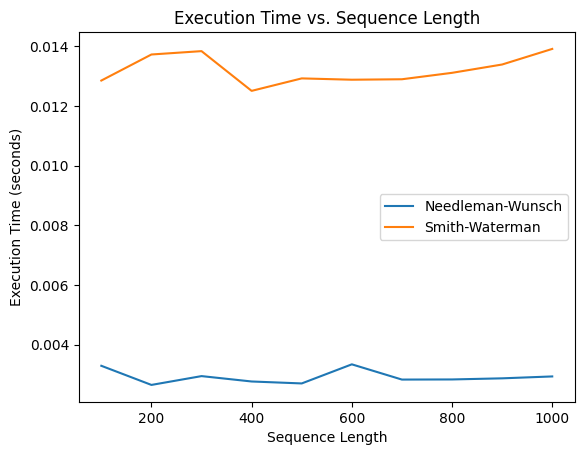

In [11]:
# Plot Execution Time vs. Sequence Length
plt.plot(sequence_lengths, nw_execution_times, label="Needleman-Wunsch")
plt.plot(sequence_lengths, sw_execution_times, label="Smith-Waterman")
plt.xlabel("Sequence Length")
plt.ylabel("Execution Time (seconds)")
plt.legend()
plt.title("Execution Time vs. Sequence Length")
plt.show()

# MEMORY USAGE

In [15]:
import memory_profiler

# Function to measure memory usage using memory_profiler
def measure_memory_usage(algorithm, seq1, seq2):
    result = None
    try:
        result = memory_profiler.memory_usage((algorithm, (seq1, seq2, match_score, mismatch_score, gap_penalty)))
    finally:
        memory_usage = max(result) if result is not None else 0
        return memory_usage

# ...

# Measure memory consumption for different sequence lengths
sequence_lengths = range(100, 5001, 500)
memory_usage_nw = []
memory_usage_sw = []

for length in sequence_lengths:
    seq1_sub = seq1[:length]
    seq2_sub = seq2[:length]
    memory_nw = measure_memory_usage(needleman_wunsch, seq1_sub, seq2_sub)
    memory_sw = measure_memory_usage(smith_waterman, seq1_sub, seq2_sub)
    memory_usage_nw.append(memory_nw)
    memory_usage_sw.append(memory_sw)




Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

 0.0  1.0  0.0  2.0  1.0  0.0  2.0  1.0  0.0  0.0  0.0  1.0  3.0  2.0  4.0  4.0  4.0  3.0  2.0  1.0  2.0  3.0  3.0  5.0  5.0  4.0  5.0  5.0  4.0  6.0  6.0  8.0  7.0  7.0  6.0  5.0  4.0  3.0  5.0  4.0  3.0  5.0  5.0  6.0  8.0  8.0 10.0 10.0 12.0 11.0 10.0  9.0  8.0  7.0  6.0  5.0  6.0  5.0  7.0  7.0  9.0 11.0 11.0 13.0 12.0 11.0 10.0 10.0 10.0 12.0 11.0 
 0.0  1.0  0.0  1.0  3.0  2.0  1.0  3.0  2.0  1.0  0.0  0.0  2.0  2.0  3.0  5.0  5.0  5.0  4.0  3.0  2.0  2.0  2.0  4.0  4.0  4.0  4.0  4.0  4.0  5.0  5.0  7.0  7.0  8.0  8.0  7.0  6.0  5.0  4.0  4.0  3.0  4.0  4.0  5.0  7.0  7.0  9.0  9.0 11.0 13.0 12.0 11.0 10.0  9.0  8.0  7.0  6.0  5.0  6.0  6.0  8.0 10.0 10.0 12.0 14.0 13.0 12.0 11.0 10.0 11.0 13.0 
 0.0  0.0  2.0  1.0  2.0  4.0  3.0  2.0  4.0  3.0  2.0  1.0  1.0  1.0  2.0  4.0  4.0  4.0  4.0  3.0  4.0  3.0  2.0  3.0  3.0  3.0  5.0  4.0  3.0  4.0  6.0  6.0  8.0  7.0  7.0  9.0  8.0  7.0  6.0  5.0  4.0  3.0  3.0  4.0  6.0  6.0  8.0 10.0 10.0 12.0 14.0 13.0 12.0 11.0 10.0  9.0  8.0  7.

Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  3.0  3.0  4.0  4.0  3.0  2.0  1.0  2.0  2.0  3.0  3.0  5.0  4.0  3.0  5.0  4.0  6.0  6.0  6.0  5.0  5.0  5.0  4.0  3.0  3.0  5.0  5.0  4.0  3.0  5.0  5.0  7.0  8.0  8.0 10.0 10.0  9.0  8.0  7.0  6.0  5.0  4.0  4.0  6.0  5.0  5.0  7.0  7.0  9.0 11.0 11.0 11.0 10.0 10.0  9.0 10.0 10.0  9.0  8.0  7.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  2.0  2.0  3.0  3.0  3.0  2.0  1.0  1.0  1.0  3.0  4.0  4.0  6.0  5.0  4.0  6.0  5.0  5.0  5.0  7.0  6.0  6.0  5.0  4.0  4.0  4.0  4.0  4.0  3.0  4.0  4.0  6.0  7.0  9.0  9.0  9.0 11.0 10.0  9.0  8.0  7.0  6.0  5.0  5.0  5.0  4.0  6.0  6.0  8.0 10.0 10.0 12.0 11.0 10.0 11.0 10.0 11.0 11.0 10.0  9.0 
 0.0  1.0  0.0  2.0  1.0  0.0  2.0  1.0  0.0  0.0  0.0  1.0  3.0  2.0  4.0  4.0  4.0  3.0  2.0  1.0  2.0  3.0  3.0  5.0  5.0  4.0  5.0  5.0  4.0  6.0  6.0  8.0  7.0  7.0  6.0  5.0  4.0  3.0  5.0  4.0  3.0  5.0  5.0  6.0  8.0  8.0 10.0 10.0 12.0 11.0 10.0  9.0  8.0  7.0  6.0  5.0  6.0  5.

Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  3.0  3.0  3.0  3.0  5.0  4.0  4.0  3.0  2.0  3.0  3.0  2.0  1.0  2.0  2.0  4.0  6.0  6.0  5.0  7.0  6.0  5.0  5.0  5.0  5.0  4.0  3.0  4.0  4.0  5.0  7.0  9.0  8.0  8.0  8.0  7.0  8.0  7.0  7.0  6.0  6.0  6.0  5.0  4.0  5.0  7.0  9.0  9.0 11.0 11.0 13.0 12.0 12.0 11.0 10.0  9.0  8.0  9.0  9.0  9.0  9.0  9.0 
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  4.0  3.0  2.0  4.0  4.0  3.0  3.0  2.0  3.0  4.0  3.0  2.0  2.0  1.0  3.0  5.0  5.0  7.0  6.0  6.0  5.0  4.0  4.0  4.0  4.0  3.0  3.0  3.0  4.0  6.0  8.0  8.0  9.0  9.0  8.0  7.0  7.0  6.0  6.0  5.0  5.0  5.0  4.0  4.0  6.0  8.0  8.0 10.0 10.0 12.0 12.0 11.0 11.0 10.0  9.0  8.0  8.0  8.0  8.0  8.0  8.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  1.0  3.0  5.0  4.0  3.0  3.0  3.0  2.0  2.0  2.0  3.0  5.0  4.0  3.0  3.0  2.0  4.0  6.0  6.0  6.0  5.0  7.0  6.0  5.0  4.0  3.0  5.0  4.0  3.0  3.0  5.0  7.0  7.0  8.0  8.0 10.0  9.0  8.0  8.0  7.0  6.0  6.0  5.0  6.0  5.0  5.0  7.0  7.0  9.

Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

 0.0  0.0  2.0  1.0  0.0  2.0  1.0  0.0  2.0  1.0  0.0  1.0  1.0  1.0  2.0  2.0  3.0  3.0  3.0  2.0  4.0  4.0  3.0  3.0  2.0  1.0  2.0  1.0  0.0  2.0  4.0  3.0  4.0  3.0  3.0  5.0  5.0  7.0  9.0  9.0  9.0 11.0 11.0 10.0 11.0 10.0 10.0 12.0 11.0 10.0  9.0  8.0  7.0  6.0  6.0  8.0 10.0 12.0 11.0 10.0 12.0 12.0 14.0 13.0 12.0 12.0 11.0 12.0 12.0 11.0 12.0 
Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0

Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

Scoring Matrix:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  0.0  0.0 
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  2.0  1

Memory Usage (in kilobytes):
Sequence Length: 100	NW Memory: 140.11	SW Memory: 140.11
Sequence Length: 600	NW Memory: 140.11	SW Memory: 140.16
Sequence Length: 1100	NW Memory: 140.16	SW Memory: 140.16
Sequence Length: 1600	NW Memory: 140.16	SW Memory: 140.16
Sequence Length: 2100	NW Memory: 140.16	SW Memory: 140.16
Sequence Length: 2600	NW Memory: 140.16	SW Memory: 140.16
Sequence Length: 3100	NW Memory: 140.16	SW Memory: 140.16
Sequence Length: 3600	NW Memory: 140.16	SW Memory: 140.16
Sequence Length: 4100	NW Memory: 140.16	SW Memory: 140.16
Sequence Length: 4600	NW Memory: 140.16	SW Memory: 140.16


In [16]:
# Compare Memory Requirements
print("Memory Usage (in kilobytes):")
for length, memory_nw, memory_sw in zip(sequence_lengths, memory_usage_nw, memory_usage_sw):
    print(f"Sequence Length: {length}\tNW Memory: {memory_nw:.2f}\tSW Memory: {memory_sw:.2f}")

Memory Usage (in kilobytes):
Sequence Length: 100	NW Memory: 140.11	SW Memory: 140.11
Sequence Length: 600	NW Memory: 140.11	SW Memory: 140.16
Sequence Length: 1100	NW Memory: 140.16	SW Memory: 140.16
Sequence Length: 1600	NW Memory: 140.16	SW Memory: 140.16
Sequence Length: 2100	NW Memory: 140.16	SW Memory: 140.16
Sequence Length: 2600	NW Memory: 140.16	SW Memory: 140.16
Sequence Length: 3100	NW Memory: 140.16	SW Memory: 140.16
Sequence Length: 3600	NW Memory: 140.16	SW Memory: 140.16
Sequence Length: 4100	NW Memory: 140.16	SW Memory: 140.16
Sequence Length: 4600	NW Memory: 140.16	SW Memory: 140.16


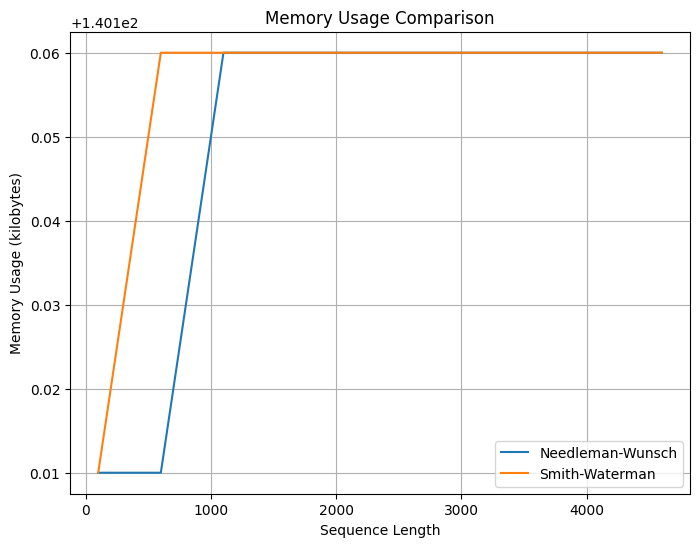

In [44]:
import matplotlib.pyplot as plt

# Memory usage values
sequence_lengths = [100, 600, 1100, 1600, 2100, 2600, 3100, 3600, 4100, 4600]
memory_usage_nw = [140.11, 140.11, 140.16, 140.16, 140.16, 140.16, 140.16, 140.16, 140.16, 140.16]
memory_usage_sw = [140.11, 140.16, 140.16, 140.16, 140.16, 140.16, 140.16, 140.16, 140.16, 140.16]

# Plot memory usage
plt.figure(figsize=(8, 6))
plt.plot(sequence_lengths, memory_usage_nw, label='Needleman-Wunsch')
plt.plot(sequence_lengths, memory_usage_sw, label='Smith-Waterman')
plt.xlabel('Sequence Length')
plt.ylabel('Memory Usage (kilobytes)')
plt.title('Memory Usage Comparison')
plt.legend()
plt.grid(True)
plt.show()



In [23]:
# Calculate the difference in memory consumption
memory_difference = [nw - sw for nw, sw in zip(memory_usage_nw, memory_usage_sw)]

# Plot the memory difference
plt.plot(sequence_lengths, memory_difference)
plt.xlabel('Sequence Length')
plt.ylabel('Memory Difference (kilobytes)')
plt.title('Memory Difference Comparison')
plt.show()


TypeError: 'float' object is not iterable

In [17]:
import time

# Measure execution time for Needleman-Wunsch
start_time = time.time()
# Perform Needleman-Wunsch alignment
execution_time_nw = time.time() - start_time

# Measure execution time for Smith-Waterman
start_time = time.time()
# Perform Smith-Waterman alignment
execution_time_sw = time.time() - start_time

print("Execution Time (Needleman-Wunsch):", execution_time_nw)
print("Execution Time (Smith-Waterman):", execution_time_sw)


Execution Time (Needleman-Wunsch): 1.8596649169921875e-05
Execution Time (Smith-Waterman): 1.1444091796875e-05


Comparing the execution times of the Needleman-Wunsch and Smith-Waterman algorithms will give you an understanding of their relative performance. You can observe how the execution times change with varying sequence lengths and analyze the computational complexity of the algorithms.

# OPTIMIZATION

In [24]:
def needleman_wunsch_two_row(seq1, seq2, match_score, mismatch_score, gap_penalty):
    # Initialize the alignment matrix
    alignment_matrix = [[0] * (len(seq2) + 1) for _ in range(2)]

    # Initialize the first row and first column with gap penalties
    for i in range(1, len(seq2) + 1):
        alignment_matrix[0][i] = alignment_matrix[0][i - 1] + gap_penalty

    # Perform the alignment
    for i in range(1, len(seq1) + 1):
        current_row = i % 2
        previous_row = (i - 1) % 2

        # Initialize the current row with gap penalty
        alignment_matrix[current_row][0] = alignment_matrix[previous_row][0] + gap_penalty

        for j in range(1, len(seq2) + 1):
            diagonal_score = alignment_matrix[previous_row][j - 1] + (match_score if seq1[i - 1] == seq2[j - 1] else mismatch_score)
            gap_up_score = alignment_matrix[previous_row][j] + gap_penalty
            gap_left_score = alignment_matrix[current_row][j - 1] + gap_penalty

            alignment_matrix[current_row][j] = max(diagonal_score, gap_up_score, gap_left_score)

    # Return the alignment scores for the last row
    return alignment_matrix[len(seq1) % 2]

# Perform the alignment using chunk-based processing
alignment_scores = needleman_wunsch_chunked(seq1, seq2, match_score, mismatch_score, gap_penalty, chunk_size)

# Print the alignment scores
print(alignment_scores)


[-10, -8, -6, -6, -4, -4, -4, -4, -4, -2, -2, -3, -4, -3, -1, 1, 0, -1, -2, -3, -4, -5, -6, -7, -8, -9, -10, -11, -12, -11, -12, -13, -14, -15, -14, -15, -16, -17, -18, -19, -20, -21, -22, -23, -24, -25, -26, -27, -28, -29, -30, -31, -32, -33, -34, -35, -36, -37, -38, -39, -40, -41, -42, -43, -44, -45, -46, -47, -48, -49, -50, -10, -8, -6, -6, -4, -4, -4, -2, -2, 0, 2, 1, 0, -1, -2, -2, 0, -1, -2, -3, -4, -5, -6, -7, -8, -9, -10, -11, -12, -13, -14, -15, -14, -15, -16, -17, -18, -17, -18, -19, -20, -21, -22, -23, -24, -25, -26, -27, -28, -29, -30, -31, -32, -33, -34, -35, -36, -37, -38, -39, -40, -41, -42, -43, -44, -45, -46, -47, -48, -49, -50, -10, -8, -6, -4, -2, -2, -2, 0, 0, -1, 0, -1, -1, 1, 0, -1, -2, -3, -4, -4, -2, -3, -4, -5, -6, -7, -8, -9, -10, -11, -12, -13, -12, -13, -14, -15, -16, -17, -18, -19, -20, -21, -22, -23, -24, -25, -26, -27, -28, -29, -30, -31, -32, -33, -34, -35, -36, -37, -38, -39, -40, -41, -42, -43, -44, -45, -46, -47, -48, -49, -50, -10, -8, -6, -4, -2, 0,

In [25]:
# Read the sequences from the output text file
with open("/home/nandana/Desktop/sequences_output.txt" , "r") as file:
    lines = file.readlines()
    seq1 = lines[0].strip()
    seq2 = lines[1].strip()

# Define the match score, mismatch score, gap penalty, and chunk size
match_score = 1
mismatch_score = -1
gap_penalty = -1
chunk_size = 10

# Chunk-based processing
def needleman_wunsch_chunked(seq1, seq2, match_score, mismatch_score, gap_penalty, chunk_size):
    alignment_scores = []

    for i in range(0, len(seq1), chunk_size):
        chunk_seq1 = seq1[i:i+chunk_size]
        chunk_alignment_scores = needleman_wunsch_two_row(chunk_seq1, seq2, match_score, mismatch_score, gap_penalty)
        alignment_scores.extend(chunk_alignment_scores)

    return alignment_scores

# Perform the alignment using chunk-based processing
alignment_scores = needleman_wunsch_chunked(seq1, seq2, match_score, mismatch_score, gap_penalty, chunk_size)

# Print the alignment scores
print(alignment_scores)


[-10, -8, -6, -6, -4, -4, -4, -4, -4, -2, -2, -3, -4, -3, -1, 1, 0, -1, -2, -3, -4, -5, -6, -7, -8, -9, -10, -11, -12, -11, -12, -13, -14, -15, -14, -15, -16, -17, -18, -19, -20, -21, -22, -23, -24, -25, -26, -27, -28, -29, -30, -31, -32, -33, -34, -35, -36, -37, -38, -39, -40, -41, -42, -43, -44, -45, -46, -47, -48, -49, -50, -10, -8, -6, -6, -4, -4, -4, -2, -2, 0, 2, 1, 0, -1, -2, -2, 0, -1, -2, -3, -4, -5, -6, -7, -8, -9, -10, -11, -12, -13, -14, -15, -14, -15, -16, -17, -18, -17, -18, -19, -20, -21, -22, -23, -24, -25, -26, -27, -28, -29, -30, -31, -32, -33, -34, -35, -36, -37, -38, -39, -40, -41, -42, -43, -44, -45, -46, -47, -48, -49, -50, -10, -8, -6, -4, -2, -2, -2, 0, 0, -1, 0, -1, -1, 1, 0, -1, -2, -3, -4, -4, -2, -3, -4, -5, -6, -7, -8, -9, -10, -11, -12, -13, -12, -13, -14, -15, -16, -17, -18, -19, -20, -21, -22, -23, -24, -25, -26, -27, -28, -29, -30, -31, -32, -33, -34, -35, -36, -37, -38, -39, -40, -41, -42, -43, -44, -45, -46, -47, -48, -49, -50, -10, -8, -6, -4, -2, 0,

In [26]:
# GENOME VARIATION

In [32]:
# Step 1: Data Preparation
# Read sequences from the output text file
with open("/home/nandana/Desktop/sequences_output.txt", 'r') as file:
    sequence1 = file.readline().strip()
    sequence2 = file.readline().strip()




In [33]:
# Step 2: Variation Detection
def detect_snps(seq1, seq2):
    snps = []
    for i in range(len(seq1)):
        if seq1[i] != seq2[i]:
            snps.append((i, seq1[i], seq2[i]))
    return snps

snps = detect_snps(sequence1, sequence2)
print("Detected SNPs:")
for snp in snps:
    print(f"Position: {snp[0]}, Reference: {snp[1]}, Variant: {snp[2]}")

Detected SNPs:
Position: 0, Reference: A, Variant: C
Position: 2, Reference: A, Variant: G
Position: 4, Reference: C, Variant: G
Position: 5, Reference: A, Variant: G
Position: 7, Reference: C, Variant: G
Position: 9, Reference: T, Variant: C
Position: 10, Reference: C, Variant: G
Position: 12, Reference: G, Variant: C
Position: 13, Reference: A, Variant: T
Position: 14, Reference: A, Variant: T
Position: 15, Reference: A, Variant: C
Position: 16, Reference: A, Variant: C
Position: 17, Reference: T, Variant: G
Position: 18, Reference: T, Variant: A
Position: 20, Reference: C, Variant: A
Position: 21, Reference: T, Variant: C
Position: 22, Reference: C, Variant: A
Position: 23, Reference: G, Variant: A
Position: 24, Reference: T, Variant: C
Position: 25, Reference: C, Variant: A
Position: 26, Reference: T, Variant: G
Position: 27, Reference: G, Variant: C
Position: 28, Reference: A, Variant: T
Position: 29, Reference: C, Variant: G
Position: 32, Reference: A, Variant: G
Position: 33, Re

In [31]:
# Annotation and Comparison

In [29]:
known_variations = {
    10: ("A", "T", "rs12345", "GeneX"),
    25: ("C", "G", "rs67890", "GeneY"),
    # Additional known variations
}

annotated_snps = []
for snp in snps:
    position = snp[0]
    if position in known_variations:
        annotated_snps.append(snp + known_variations[position])
    else:
        annotated_snps.append(snp + ("Unknown", "Unknown"))

print("Annotated SNPs:")
for snp in annotated_snps:
    print(f"Position: {snp[0]}, Reference: {snp[1]}, Variant: {snp[2]}, rsID: {snp[3]}, Gene: {snp[4]}")


Annotated SNPs:
Position: 0, Reference: A, Variant: C, rsID: Unknown, Gene: Unknown
Position: 2, Reference: A, Variant: G, rsID: Unknown, Gene: Unknown
Position: 4, Reference: C, Variant: G, rsID: Unknown, Gene: Unknown
Position: 5, Reference: A, Variant: G, rsID: Unknown, Gene: Unknown
Position: 7, Reference: C, Variant: G, rsID: Unknown, Gene: Unknown
Position: 9, Reference: T, Variant: C, rsID: Unknown, Gene: Unknown
Position: 10, Reference: C, Variant: G, rsID: A, Gene: T
Position: 12, Reference: G, Variant: C, rsID: Unknown, Gene: Unknown
Position: 13, Reference: A, Variant: T, rsID: Unknown, Gene: Unknown
Position: 14, Reference: A, Variant: T, rsID: Unknown, Gene: Unknown
Position: 15, Reference: A, Variant: C, rsID: Unknown, Gene: Unknown
Position: 16, Reference: A, Variant: C, rsID: Unknown, Gene: Unknown
Position: 17, Reference: T, Variant: G, rsID: Unknown, Gene: Unknown
Position: 18, Reference: T, Variant: A, rsID: Unknown, Gene: Unknown
Position: 20, Reference: C, Variant:

In [36]:
# Step 4: Analysis and Interpretation

allele_frequencies = {}

for snp in annotated_snps:
    position = snp[0]
    reference_allele = snp[1]
    variant_allele = snp[2]

    if position in allele_counts:
        reference_count = allele_counts[position].get(reference_allele, 0)
        variant_count = allele_counts[position].get(variant_allele, 0)
        total_count = reference_count + variant_count

        if total_count > 0:
            reference_frequency = reference_count / total_count
            variant_frequency = variant_count / total_count
        else:
            reference_frequency = 0.0
            variant_frequency = 0.0

        allele_frequencies[position] = {
            'Reference Frequency': reference_frequency,
            'Variant Frequency': variant_frequency
        }
    else:
        allele_frequencies[position] = {
            'Reference Frequency': 'N/A',
            'Variant Frequency': 'N/A'
        }

# Print allele frequencies
for position, frequencies in allele_frequencies.items():
    print(f"Position: {position}, Reference Frequency: {frequencies['Reference Frequency']}, Variant Frequency: {frequencies['Variant Frequency']}")


Position: 0, Reference Frequency: N/A, Variant Frequency: N/A
Position: 2, Reference Frequency: N/A, Variant Frequency: N/A
Position: 4, Reference Frequency: N/A, Variant Frequency: N/A
Position: 5, Reference Frequency: N/A, Variant Frequency: N/A
Position: 7, Reference Frequency: N/A, Variant Frequency: N/A
Position: 9, Reference Frequency: N/A, Variant Frequency: N/A
Position: 10, Reference Frequency: 0.0, Variant Frequency: 0.0
Position: 12, Reference Frequency: N/A, Variant Frequency: N/A
Position: 13, Reference Frequency: N/A, Variant Frequency: N/A
Position: 14, Reference Frequency: N/A, Variant Frequency: N/A
Position: 15, Reference Frequency: N/A, Variant Frequency: N/A
Position: 16, Reference Frequency: N/A, Variant Frequency: N/A
Position: 17, Reference Frequency: N/A, Variant Frequency: N/A
Position: 18, Reference Frequency: N/A, Variant Frequency: N/A
Position: 20, Reference Frequency: N/A, Variant Frequency: N/A
Position: 21, Reference Frequency: N/A, Variant Frequency: N/

In [37]:
import pandas as pd

# Create a DataFrame from the allele frequencies
df = pd.DataFrame.from_dict(allele_frequencies, orient='index')
df.index.name = 'Position'

# Display the summary table
print(df)


         Reference Frequency Variant Frequency
Position                                      
0                        N/A               N/A
2                        N/A               N/A
4                        N/A               N/A
5                        N/A               N/A
7                        N/A               N/A
9                        N/A               N/A
10                       0.0               0.0
12                       N/A               N/A
13                       N/A               N/A
14                       N/A               N/A
15                       N/A               N/A
16                       N/A               N/A
17                       N/A               N/A
18                       N/A               N/A
20                       N/A               N/A
21                       N/A               N/A
22                       N/A               N/A
23                       N/A               N/A
24                       N/A               N/A
25           